In [1]:
# Load libraries

# # Plotting utils 
import datetime
import glob
import os
import pickle
import time
import warnings
from datetime import date, timedelta
import Ngl
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util
import matplotlib as matplotlib
import matplotlib.animation as animation
import matplotlib.colors as colors
import matplotlib.dates as mdates
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import FormatStrFormatter
import metpy.calc as mpc
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import xarray as xr
from matplotlib.dates import DateFormatter
from metpy.units import units
from metpy import interpolate
from metpy.calc import vertical_velocity
from mpl_toolkits.axes_grid1 import make_axes_locatable

warnings.filterwarnings('ignore')


In [52]:
def plots_timeHeight(DS1, 
                     varPlot, unitsStr, clims, dlims, 
                     topLev=500, cbarFormat='%.2f', cbTicks=5): 
    
    
    fig,axs = plt.subplots(1,3, figsize=(12,4))
    axs     = axs.ravel()

    axs[0].contourf(DS1.hour.values, DS1.levInterp.values, DS1[varPlot].isel(case=0).transpose().values, clims, cmap = 'jet', extend='both')
    
    c = axs[1].contourf(DS1.hour.values, DS1.levInterp.values, DS1[varPlot].isel(case=1).transpose().values, clims, cmap = 'jet', extend='both')
    #Add colorbar
    ax_position = axs[1].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.1, ax_position.width+0.08, 0.025])
    cbar = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
    cbar.ax.locator_params(nbins=cbTicks)
    
    c = axs[2].contourf(DS1.hour.values, DS1.levInterp.values, 
                    DS1[varPlot].isel(case=1).transpose().values - DS1[varPlot].isel(case=0).transpose().values, 
                    dlims, cmap = 'seismic', extend='both')
    #Add colorbar
    ax_position = axs[2].get_position()
    cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.1, ax_position.width, 0.025])
    cbar = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
    cbar.ax.locator_params(nbins=cbTicks)


    axs[0].set_title(str(varPlot)+'\n'+str(DS1[varPlot].isel(case=0).case.values))
    axs[1].set_title(DS1[varPlot].isel(case=1).case.values)
    axs[2].set_title('HET-HOM')


    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()


    axs[0].set_ylim([980, topLev])
    axs[1].set_ylim([980, topLev])
    axs[2].set_ylim([980, topLev])

    
    return axs

In [53]:
def plots_timeHeight_weightMFplumes(DS1, varPlot, unitsStr, clims, dlims, 
                                    topLev=500, cbarFormat='%.2f', cbTicks=5): 
    
    ## Get the weights 
    HOMwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=0).resample(time='1H').mean().fillna(0)
    HETwgts_DS1 = DS1.upa_macmicAvg_interp.isel(case=1).resample(time='1H').mean().fillna(0)
    homMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
    hetMean_DS1 = DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS1).mean(dim='nens').groupby('time.hour').mean(dim='time')
    diff_DS1    = (DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=1).resample(time='1H').mean().weighted(HETwgts_DS1).mean(dim='nens') - DS1[varPlot].where(DS1.levInterp.values>=topLev).isel(case=0).resample(time='1H').mean().weighted(HOMwgts_DS1).mean(dim='nens')).groupby('time.hour').mean(dim='time')

    fig,axs = plt.subplots(1,3, figsize=(12,4))
    axs     = axs.ravel()

    axs[0].contourf(homMean_DS1.hour.values, homMean_DS1.levInterp.values, homMean_DS1.transpose().values, clims, cmap = 'jet', extend='both')
    cplt=axs[1].contourf(hetMean_DS1.hour.values, hetMean_DS1.levInterp.values, hetMean_DS1.transpose().values, clims, cmap = 'jet', extend='both')
    #Add colorbar
    ax_position = axs[1].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.1, ax_position.width+0.08, 0.025])
    cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
    cbar.ax.locator_params(nbins=cbTicks)

    cplt=axs[2].contourf(diff_DS1.hour.values, diff_DS1.levInterp.values, 
                    diff_DS1.transpose().values, 
                    dlims, cmap = 'seismic', extend='both')
    #Add colorbar
    ax_position = axs[2].get_position()
    cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.1, ax_position.width, 0.025])
    cbar = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax, label=unitsStr, format=cbarFormat)
    cbar.ax.locator_params(nbins=cbTicks)

    axs[0].set_title(str(varPlot)+'\n'+str(DS1[varPlot].isel(case=0).case.values))
    axs[1].set_title(DS1[varPlot].isel(case=1).case.values)
    axs[2].set_title('HET-HOM')

    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()

    axs[0].set_ylim([980, topLev])
    axs[1].set_ylim([980, topLev])
    axs[2].set_ylim([980, topLev])

    return axs

In [30]:


def plotDiurnalCycle(DS1, 
                     varPlot, valMult, unitsString,
                     setYlims, yMin, yMax): 
    
    fig,axs = plt.subplots(1,1, figsize=(6,5))
    
    DS1_mean,pVal_DS1 = getMeansAndSig(valMult, DS1, varPlot)
    
    ## First option 
    axs.plot(DS1_mean.hour.values, DS1_mean.isel(case=0).values, color='dodgerblue', label=DS1_mean.isel(case=0).case.values) 
    axs.plot(DS1_mean.hour.values, DS1_mean.isel(case=1).values, color='orangered',  label=DS1_mean.isel(case=1).case.values) 
    axs.legend()
    
    axs.set_title(varPlot,fontsize=14)
    axs.set_ylabel(unitsString, fontsize=12)
    axs.set_xlabel('Local Time (hour)', fontsize=12)
    if setYlims==True: 
        axs.set_ylim([yMin, yMax])
        
    return axs



**Set up Dask**

In [2]:
!qstat -u mdfowler

                                                            Req'd  Req'd   Elap
Job ID          Username Queue    Jobname    SessID NDS TSK Memory Time  S Time
--------------- -------- -------- ---------- ------ --- --- ------ ----- - -----
9585149.casper* mdfowler htc      STDIN       20920   1   1   32gb 06:00 R 01:11


In [3]:
import dask

from dask_jobqueue import PBSCluster

# For Casper
cluster = PBSCluster(
    queue="casper",
    walltime="06:00:00",
    project="P93300642",
    memory="4GB",
    resource_spec="select=1:ncpus=1:mem=4GB",
    cores=1,
    processes=1,
)


In [4]:
from dask.distributed import Client

# Connect client to the remote dask workers
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/mdfowler/Extra/proxy/8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/mdfowler/Extra/proxy/8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://128.117.208.100:38725,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/mdfowler/Extra/proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [5]:
cluster.scale(24)


In [6]:
client.wait_for_workers(24)

## Get data

In [2]:
%%time 
## Read in from files above: 
file_name_h0_L50 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h0_2015and16_L50_20231219.nc'
file_name_h2_L50 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h2_2015and16_L50_20231219.nc'

file_name_h0_L250 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h0_2015and16_L250_20231219.nc'
file_name_h2_L250 = '/glade/scratch/mdfowler/claspMF_extrmSfc_25pct/allJJA/scamDS_h2_2015and16_L250_20231219.nc'


scamDS_h0_L50 = xr.open_dataset(file_name_h0_L50, decode_times=True)
scamDS_h2_L50 = xr.open_dataset(file_name_h2_L50, decode_times=True)

scamDS_h0_L250 = xr.open_dataset(file_name_h0_L250, decode_times=True)
scamDS_h2_L250 = xr.open_dataset(file_name_h2_L250, decode_times=True)



CPU times: user 3.14 s, sys: 411 ms, total: 3.55 s
Wall time: 3.96 s


## Try to make sense of something

In [171]:
scamDS_h2_L250

<xarray.Dataset>
Dimensions:                (case: 2, time: 52992, nens: 25, ilev: 59, lev: 58,
                            levInterp: 78)
Coordinates:
    lat                    float64 ...
    lon                    float64 ...
  * lev                    (lev) float64 3.018 5.445 9.087 ... 983.2 991.2 997.5
  * ilev                   (ilev) float64 2.055 3.98 6.909 ... 987.4 995.1 1e+03
  * time                   (time) datetime64[ns] 2015-06-02T00:03:30 ... 2016...
  * nens                   (nens) int64 0 1 2 3 4 5 6 7 ... 18 19 20 21 22 23 24
  * levInterp              (levInterp) float64 200.0 210.0 220.0 ... 960.0 970.0
    ncyc                   int64 ...
  * case                   (case) <U11 'HOM_L0eq250' 'HET_L0eq250'
Data variables: (12/40)
    edmf_upa               (case, time, nens, ilev) float32 ...
    edmf_upw               (case, time, nens, ilev) float32 ...
    edmf_upqt              (case, time, nens, ilev) float32 ...
    edmf_upthl             (case, time, nens, ilev) float32 ...
    edmf_cloudfrac         (case, time, lev, nens, ilev) float32 ...
    edmf_dnw               (case, time, nens, ilev) float32 ...
    ...                     ...
    plumeLabel             (case, time, nens) <U10 ...
    total_wp2              (case, time, levInterp) float64 ...
    total_thlp2            (case, time, levInterp) float64 ...
    total_rtp2             (case, time, levInterp) float64 ...
    total_wpthlp           (case, time, levInterp) float64 ...
    total_wprtp            (case, time, levInterp) float64 ...

## 2015 vs 2016

Text(0.5, 1.0, 'Cumulative Precipitation')

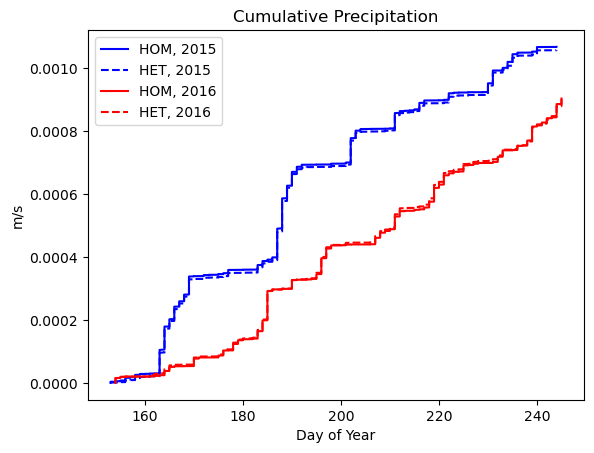

In [158]:
plt.plot(scamDS_h0_L250.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2015)).time.dt.dayofyear, 
         scamDS_h0_L250.PRECT.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2015)).cumsum(), 'b', label='HOM, 2015')
plt.plot(scamDS_h0_L250.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2015)).time.dt.dayofyear, 
         scamDS_h0_L250.PRECT.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2015)).cumsum(), 'b--', label='HET, 2015')

plt.plot(scamDS_h0_L250.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2016)).time.dt.dayofyear,
         scamDS_h0_L250.PRECT.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2016)).cumsum(), 'r', label='HOM, 2016')
plt.plot(scamDS_h0_L250.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2016)).time.dt.dayofyear,
         scamDS_h0_L250.PRECT.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2016)).cumsum(), 'r--',label='HET, 2016')
plt.legend()
plt.ylabel(scamDS_h0_L250.PRECT.units)
plt.xlabel('Day of Year')
plt.title('Cumulative Precipitation')

Text(0.5, 1.0, '2m Temperature')

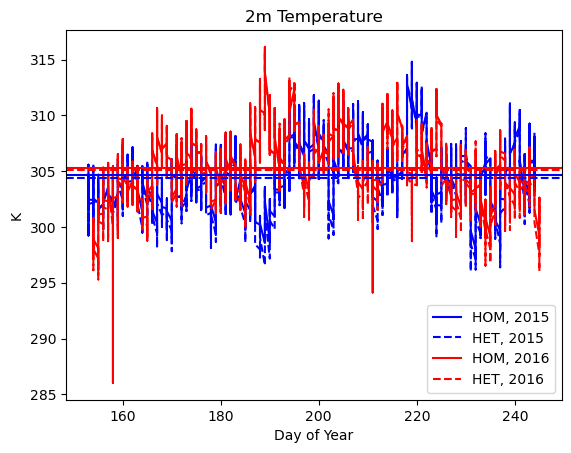

In [163]:
plt.plot(scamDS_h0_L250.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2015)).time.dt.dayofyear, 
         scamDS_h0_L250.TREFHT.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2015)), 'b', label='HOM, 2015')
plt.plot(scamDS_h0_L250.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2015)).time.dt.dayofyear, 
         scamDS_h0_L250.TREFHT.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2015)), 'b--', label='HET, 2015')

plt.plot(scamDS_h0_L250.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2016)).time.dt.dayofyear,
         scamDS_h0_L250.TREFHT.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2016)), 'r', label='HOM, 2016')
plt.plot(scamDS_h0_L250.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2016)).time.dt.dayofyear,
         scamDS_h0_L250.TREFHT.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2016)), 'r--',label='HET, 2016')

plt.axhline(np.nanmean(scamDS_h0_L250.TREFHT.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2015))), color='b')
plt.axhline(np.nanmean(scamDS_h0_L250.TREFHT.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2015))), color='b', linestyle='--')

plt.axhline(np.nanmean(scamDS_h0_L250.TREFHT.isel(case=0, time=(scamDS_h0_L250.time.dt.year==2016))), color='r')
plt.axhline(np.nanmean(scamDS_h0_L250.TREFHT.isel(case=1, time=(scamDS_h0_L250.time.dt.year==2016))), color='r', linestyle='--')

plt.legend()
plt.ylabel(scamDS_h0_L250.TREFHT.units)
plt.xlabel('Day of Year')
plt.title('2m Temperature')



Text(0.5, 1.0, 'Cumulative Precipitation')

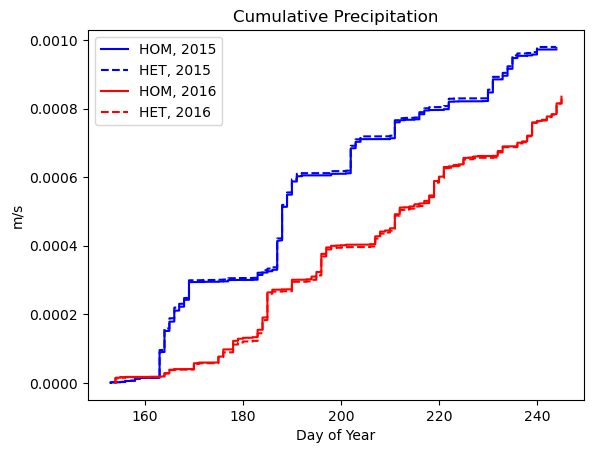

In [164]:
plt.plot(scamDS_h0_L50.isel(case=0, time=(scamDS_h0_L50.time.dt.year==2015)).time.dt.dayofyear, 
         scamDS_h0_L50.PRECT.isel(case=0, time=(scamDS_h0_L50.time.dt.year==2015)).cumsum(), 'b', label='HOM, 2015')
plt.plot(scamDS_h0_L50.isel(case=1, time=(scamDS_h0_L50.time.dt.year==2015)).time.dt.dayofyear, 
         scamDS_h0_L50.PRECT.isel(case=1, time=(scamDS_h0_L50.time.dt.year==2015)).cumsum(), 'b--', label='HET, 2015')

plt.plot(scamDS_h0_L50.isel(case=0, time=(scamDS_h0_L50.time.dt.year==2016)).time.dt.dayofyear,
         scamDS_h0_L50.PRECT.isel(case=0, time=(scamDS_h0_L50.time.dt.year==2016)).cumsum(), 'r', label='HOM, 2016')
plt.plot(scamDS_h0_L50.isel(case=1, time=(scamDS_h0_L50.time.dt.year==2016)).time.dt.dayofyear,
         scamDS_h0_L50.PRECT.isel(case=1, time=(scamDS_h0_L50.time.dt.year==2016)).cumsum(), 'r--',label='HET, 2016')
plt.legend()
plt.ylabel(scamDS_h0_L50.PRECT.units)
plt.xlabel('Day of Year')
plt.title('Cumulative Precipitation')

In [130]:
## get reference diurnal cycles for context
diuranlCylce_2015  = scamDS_h0_L250.isel(time=scamDS_h0_L250.time.dt.year==2015).resample(time='1H').mean().groupby('time.hour').mean(dim='time')
diuranlCylce_2016  = scamDS_h0_L250.isel(time=scamDS_h0_L250.time.dt.year==2016).resample(time='1H').mean().groupby('time.hour').mean(dim='time')


## Pick individual days

In [162]:
# ## Clear day: 8/15/2015
# yrSel = 2015
# monSel = 8
# daySel = 15

## Cloudy day: 7/16/2015
yrSel = 2015
monSel = 7
daySel = 16

selDS    = scamDS_h0_L250.isel(time=((scamDS_h0_L250.time.dt.year==yrSel) & (scamDS_h0_L250.time.dt.month==monSel) & (scamDS_h0_L250.time.dt.day==daySel)) )
selDS_hr = scamDS_h0_L250.isel(time=((scamDS_h0_L250.time.dt.year==yrSel) & (scamDS_h0_L250.time.dt.month==monSel) & (scamDS_h0_L250.time.dt.day==daySel)) ).resample(time='1H').mean().groupby('time.hour').mean(dim='time')

selDS_h2    = scamDS_h2_L250.isel(time=((scamDS_h2_L250.time.dt.year==yrSel) & (scamDS_h2_L250.time.dt.month==monSel) & (scamDS_h2_L250.time.dt.day==daySel)) )
selDS_h2_hr = scamDS_h2_L250.isel(time=((scamDS_h2_L250.time.dt.year==yrSel) & (scamDS_h2_L250.time.dt.month==monSel) & (scamDS_h2_L250.time.dt.day==daySel)) ).resample(time='1H').mean().groupby('time.hour').mean(dim='time')


**Information on plumes**

Text(0.48, 0.96, '7/16/2015')

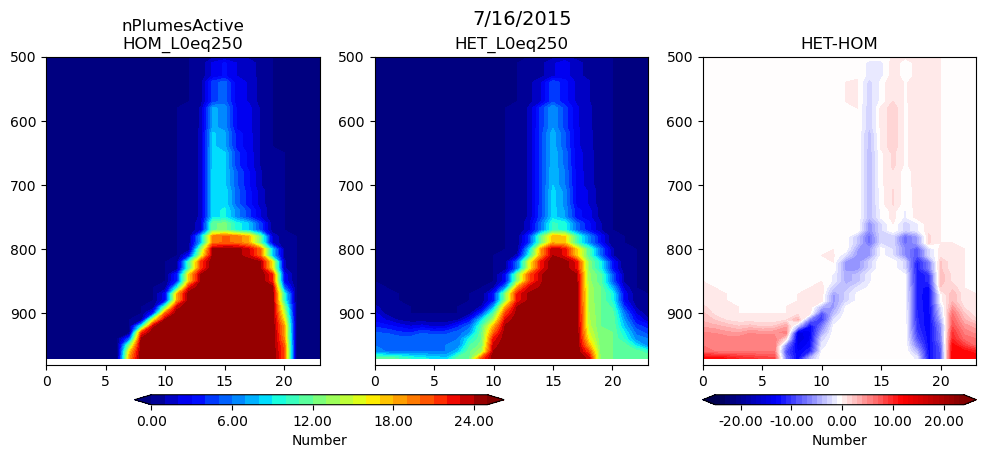

In [163]:
varPlot = 'nPlumesActive'
unitsStr = 'Number'

cStep = 1
clims = np.arange(0, 25+cStep, 1)
dMax = 20
dStep = (2*dMax)/26
dlims = np.arange(-25, 25, 1)

axs = plots_timeHeight(selDS_hr, varPlot, unitsStr, clims, dlims, 
                     topLev=500, cbarFormat='%.2f', cbTicks=5)

plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)


Text(0.48, 0.96, '7/16/2015')

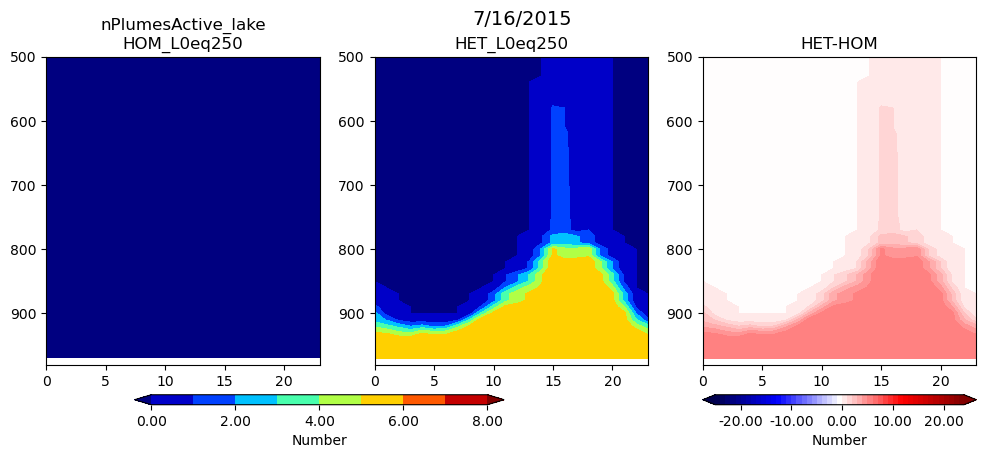

In [164]:
varPlot = 'nPlumesActive_lake'
unitsStr = 'Number'

cStep = 1
clims = np.arange(0, 8+cStep, 1)
dMax = 20
dStep = (2*dMax)/26
dlims = np.arange(-25, 25, 1)

axs = plots_timeHeight(selDS_hr, varPlot, unitsStr, clims, dlims, 
                     topLev=500, cbarFormat='%.2f', cbTicks=5)

plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)


(0.0, 10.0)

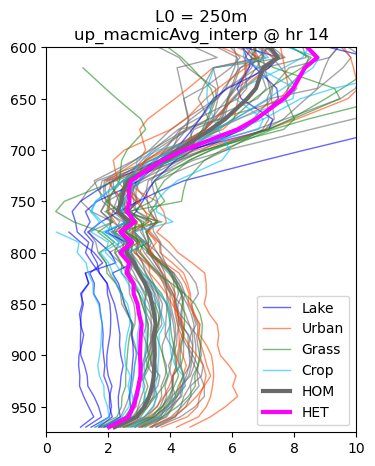

In [177]:
hrSel = 14
varSel = 'up_macmicAvg_interp'
# varSel = 'thlu_macmicAvg_interp'
# varSel = 'qtu_macmicAvg_interp'
# varSel = 'edmf_upbuoy_interp'


fig,axs = plt.subplots(1,1,figsize=(4,5))


selDS_h2
# - - - - - - - - - - - - 
# L250 
# - - - - - - - - - - - - 

## HOM 
thisHr_L250_HOM = selDS_h2.isel(time=np.where(selDS_h2['time.hour']==hrSel)[0]).isel(case=0)
homVarWgt = thisHr_L250_HOM['upa_macmicAvg_interp'].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').fillna(0)
homVar    = thisHr_L250_HOM[varSel].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').weighted(homVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
homVarEns = thisHr_L250_HOM[varSel].where(thisHr_L250_HOM.plumeLabel == 'SurfaceAvg').resample(time='1H').mean().mean(dim='time')

## HET
thisHr_L250_HET = selDS_h2.isel(time=np.where(selDS_h2['time.hour']==hrSel)[0]).isel(case=1)
hetVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].fillna(0)
hetVar    = thisHr_L250_HET[varSel].weighted(hetVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')    

grassVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'C3grass').fillna(0)
cropVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').fillna(0)
lakeVarWgt  = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Lake').fillna(0)
urbanVarWgt = thisHr_L250_HET['upa_macmicAvg_interp'].where(thisHr_L250_HET.plumeLabel == 'Urban').fillna(0)

grassVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'C3grass').weighted(grassVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
cropVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').weighted(cropVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
lakeVar  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Lake').weighted(lakeVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')
urbanVar = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Urban').weighted(urbanVarWgt).mean(dim='nens').resample(time='1H').mean().mean(dim='time')

## Add to Plot 
for iEns in range(len(selDS_h2.nens.values)):
    axs.plot(homVarEns.values[iEns],homVar.levInterp, color='dimgrey',linewidth=1,alpha=0.6)

## Plot lake plumes 
lakeVarEns  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Lake').resample(time='1H').mean().mean(dim='time')
for iEns in range(len(selDS_h2.nens.values)):
    if iEns==0:
        axs.plot(lakeVarEns.values[iEns],homVar.levInterp, color='blue',linewidth=1,alpha=0.6, label='Lake')
    else:
        axs.plot(lakeVarEns.values[iEns],homVar.levInterp, color='blue',linewidth=1,alpha=0.6)

urbanVarEns = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'Urban').resample(time='1H').mean().mean(dim='time')
for iEns in range(len(selDS_h2.nens.values)):
    if iEns==0:
        axs.plot(urbanVarEns.values[iEns],homVar.levInterp, color='orangered',linewidth=1,alpha=0.6, label='Urban')
    else:
        axs.plot(urbanVarEns.values[iEns],homVar.levInterp, color='orangered',linewidth=1,alpha=0.6)


grassVarEns = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'C3grass').resample(time='1H').mean().mean(dim='time')
for iEns in range(len(selDS_h2.nens.values)):
    if iEns==0:
        axs.plot(grassVarEns.values[iEns],homVar.levInterp, color='forestgreen',linewidth=1,alpha=0.6, label='Grass')
    else:
        axs.plot(grassVarEns.values[iEns],homVar.levInterp, color='forestgreen',linewidth=1,alpha=0.6)


cropVarEns  = thisHr_L250_HET[varSel].where(thisHr_L250_HET.plumeLabel == 'IrrigCrop').resample(time='1H').mean().mean(dim='time')
for iEns in range(len(selDS_h2.nens.values)):
    if iEns==0:
        axs.plot(cropVarEns.values[iEns],homVar.levInterp, color='deepskyblue',linewidth=1,alpha=0.6, label='Crop')
    else:
        axs.plot(cropVarEns.values[iEns],homVar.levInterp, color='deepskyblue',linewidth=1,alpha=0.6)

axs.plot(homVar.values, homVar.levInterp, color='dimgrey', linewidth=3,  label='HOM')
axs.plot(hetVar.values, hetVar.levInterp, color='magenta', linewidth=3, linestyle='-',label='HET')

axs.legend()

# axs.plot(grassVar.values, grassVar.levInterp, color='forestgreen',  linewidth=2, linestyle='-.', alpha=0.8, label='C3grass')
# axs.plot(cropVar.values, cropVar.levInterp, color='deepskyblue', linewidth=2, linestyle='--', alpha=0.8, label='IrrCrop')
# axs.plot(lakeVar.values, lakeVar.levInterp, color='blue', linewidth=2, alpha=0.7, label='Lake')
# axs.plot(urbanVar.values, urbanVar.levInterp, color='orangered', linewidth=2, alpha=0.7, label='Urban')
axs.legend()

axs.invert_yaxis()
axs.set_title('L0 = 250m\n'+varSel+' @ hr '+str(hrSel))
axs.set_ylim([975, 600])

# # 'thlu_macmicAvg_interp'
# axs[0].set_xlim([308,313])
# axs[1].set_xlim([308,313])
# axs[0].set_xlim([304,311])  ## 5am
# axs[1].set_xlim([304,311])

# # up_macmicAvg 
axs.set_xlim([0,6])
axs.set_xlim([0,10])

# # qtu_macmicAvg
# axs.set_xlim([0.012,0.019])

# # buoyancy
# axs[0].set_xlim([0,0.04])
# axs[1].set_xlim([0,0.04])


Text(0.48, 0.96, '7/16/2015')

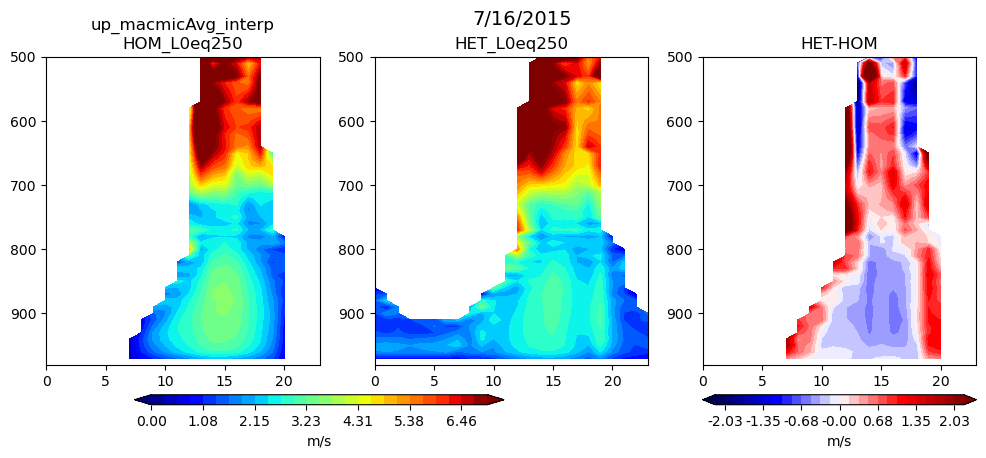

In [166]:
varPlot = 'up_macmicAvg_interp'
unitsStr = 'm/s'

cStep = (7-0)/26
clims = np.arange(0, 7+cStep, cStep)
dMax = 2.2
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)
topLev = 500

axs = plots_timeHeight_weightMFplumes(selDS_h2, varPlot, unitsStr, clims, dlims, topLev,
                                       cbarFormat='%.2f', cbTicks=7)
plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)


Text(0.48, 0.96, '7/16/2015')

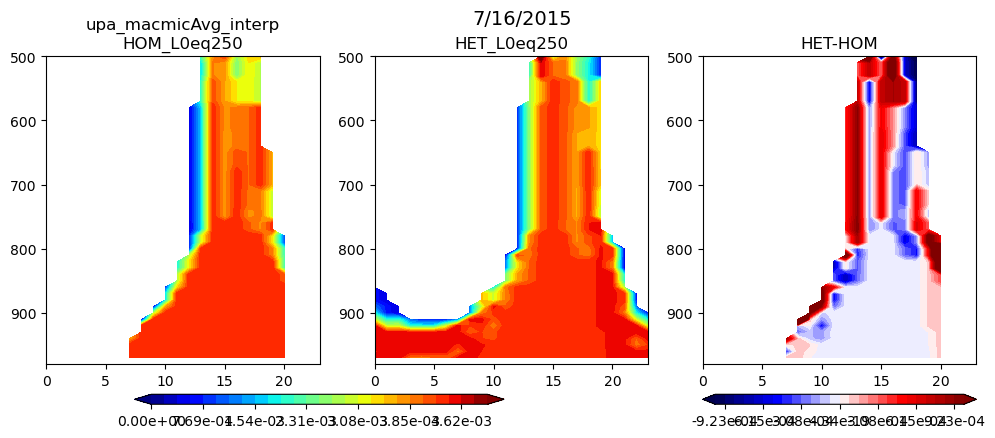

In [167]:
varPlot = 'upa_macmicAvg_interp'
unitsStr = ''

cStep = (0.005-0)/26
clims = np.arange(0, 0.005+cStep, cStep)
dMax = 0.001
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(selDS_h2, varPlot, unitsStr, clims, dlims, topLev,
                                       cbarFormat='%.2e', cbTicks=7)
plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)


Text(0.48, 0.96, '7/16/2015')

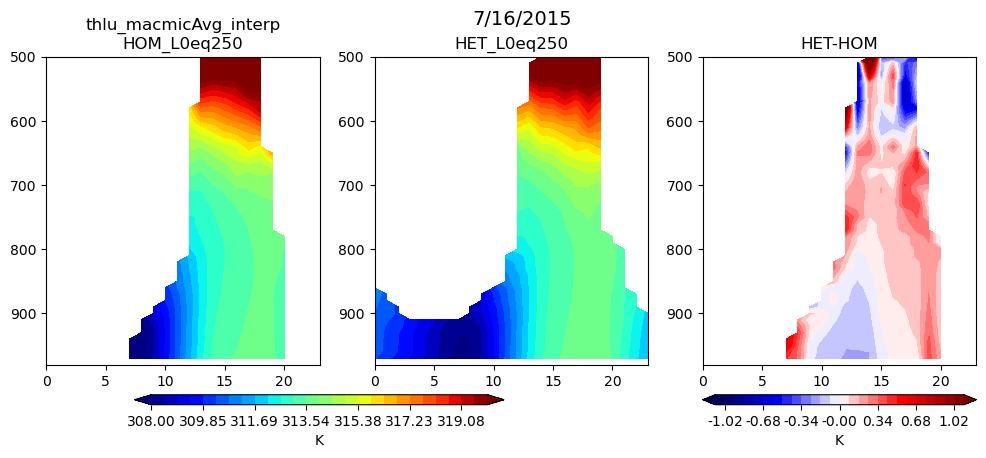

In [179]:
varPlot = 'thlu_macmicAvg_interp'
unitsStr = 'K'

# cStep = (310 - 301)/26
# clims = np.arange(301, 310+cStep, cStep)
cStep = (320 - 308)/26
clims = np.arange(308, 320+cStep, cStep)
dMax = 1.1
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

axs = plots_timeHeight_weightMFplumes(selDS_h2, varPlot, unitsStr, clims, dlims, topLev,
                                       cbarFormat='%.2f', cbTicks=7)
plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)


Text(0.48, 0.96, '7/16/2015')

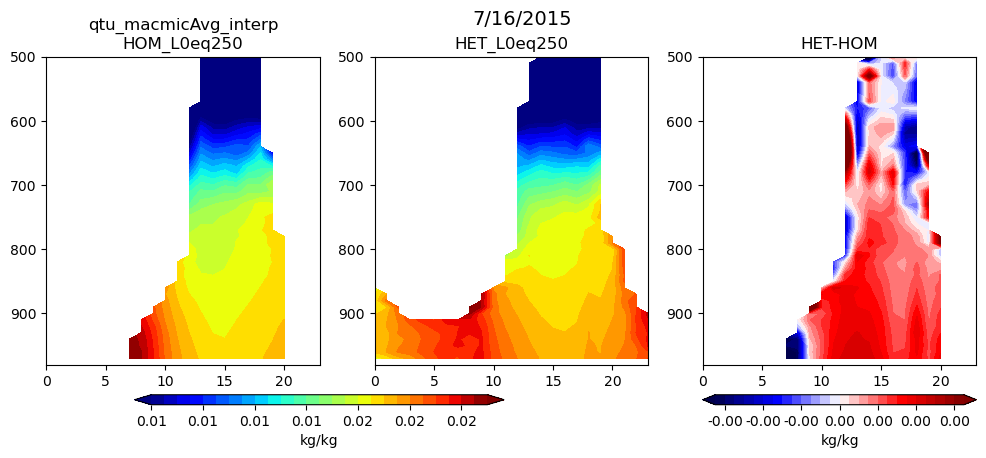

In [184]:
varPlot  = 'qtu_macmicAvg_interp'
unitsStr = 'kg/kg'

# cStep = (0.014 - 0.01)/26
# clims = np.arange(0.01, 0.014+cStep, cStep)
cStep = (0.019 - 0.01)/26
clims = np.arange(0.01, 0.019+cStep, cStep)

dMax = 0.81e-3
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)
axs = plots_timeHeight_weightMFplumes(selDS_h2, varPlot, unitsStr, clims, dlims, topLev,
                                       cbarFormat='%.2f', cbTicks=7)
plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)


**How does the atm really respond?**

Text(0.48, 0.96, '7/16/2015')

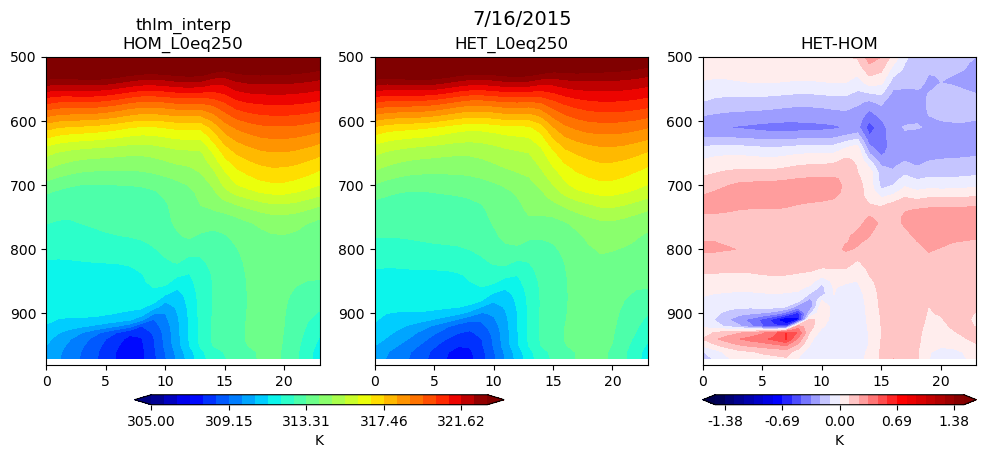

In [170]:
varPlot = 'thlm_interp'
unitsStr = scamDS_h0_L250.thlm.units

cStep = (323 - 305)/26
clims = np.arange(305, 323+cStep, cStep)
dMax = 1.5
dStep = (2*dMax)/26
dlims = np.arange(-dMax, dMax+dStep, dStep)

plots_timeHeight(selDS_hr, varPlot, unitsStr, clims, dlims, 
                     topLev=500, cbarFormat='%.2f', cbTicks=5)
plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)



Text(0.48, 0.96, '7/16/2015')

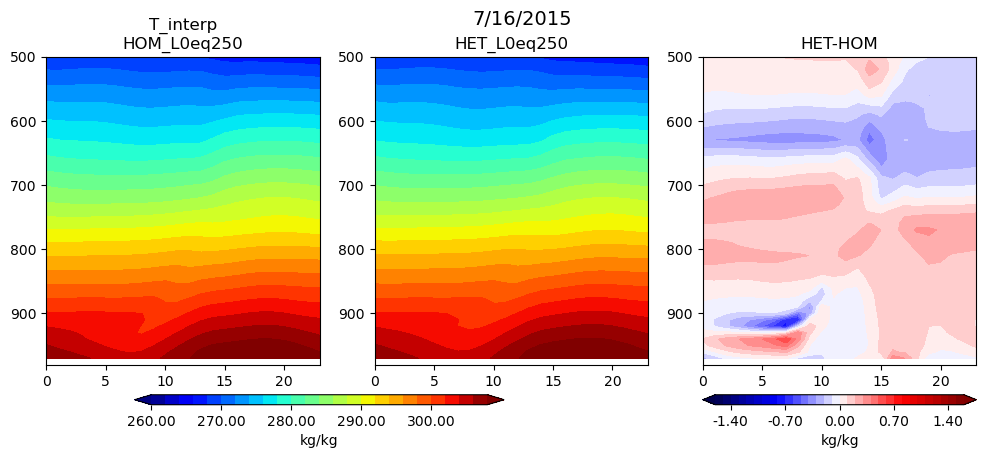

In [171]:
varPlot = 'T_interp'
unitsStr = scamDS_h0_L50.Q.units

clims = np.arange(260,310,2)
dlims = np.arange(-1.6,1.7, 0.1)


plots_timeHeight(selDS_hr, varPlot, unitsStr, clims, dlims, 
                     topLev=500, cbarFormat='%.2f', cbTicks=5)
plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)



Text(0.48, 0.96, '7/16/2015')

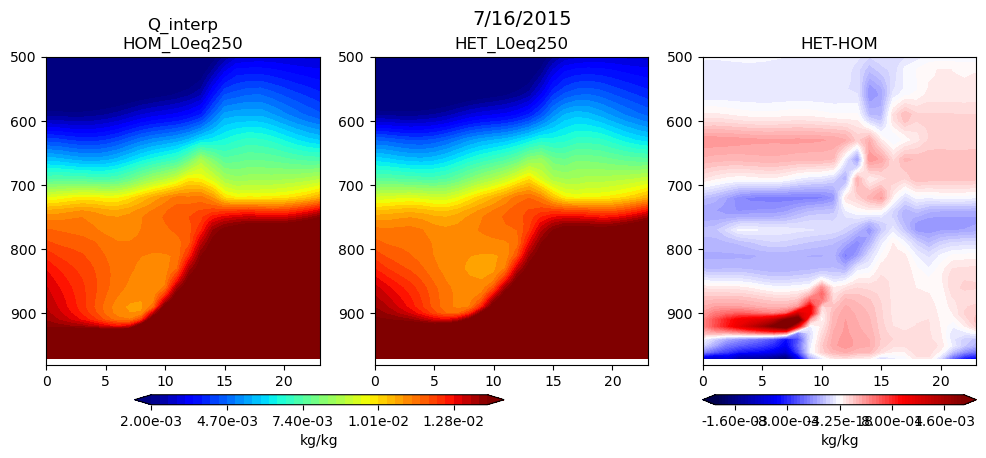

In [172]:
varPlot = 'Q_interp'
unitsStr = scamDS_h0_L50.Q.units

clims = np.arange(0.002,0.014,0.0003)
dlims = np.arange(-1.9e-3, 1.95e-3, 0.05e-3)


plots_timeHeight(selDS_hr, varPlot, unitsStr, clims, dlims, 
                     topLev=500, cbarFormat='%.2e', cbTicks=5)
plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)



Text(0.48, 0.96, '7/16/2015')

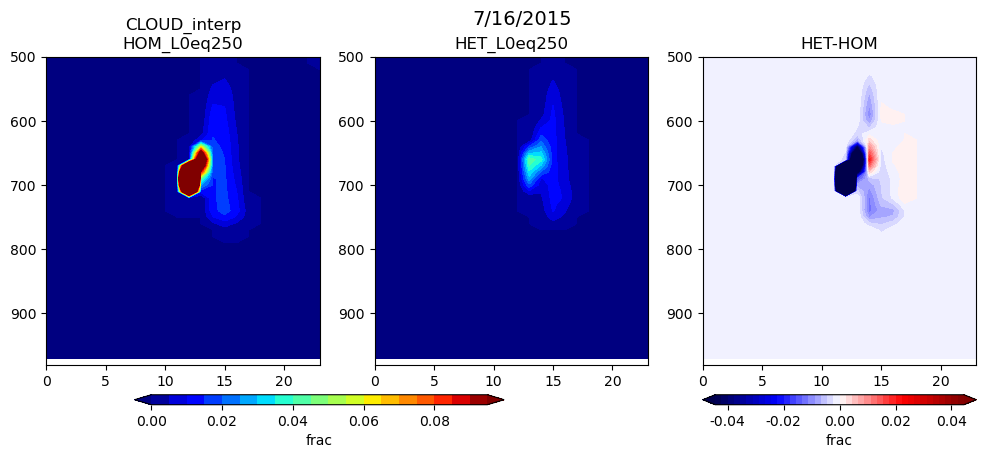

In [173]:
varPlot = 'CLOUD_interp'
unitsStr = 'frac'

clims = np.arange(0,0.1,0.005)
dlims = np.arange(-0.04, 0.042, 0.002)

plots_timeHeight(selDS_hr, varPlot, unitsStr, clims, dlims, 
                     topLev=500, cbarFormat='%.2f', cbTicks=5)
plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)



Text(0.48, 0.96, '7/16/2015')

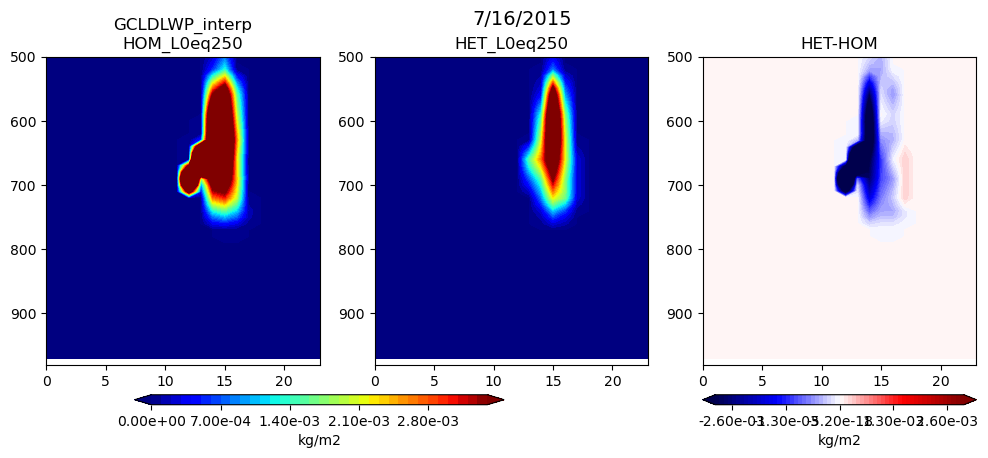

In [174]:
varPlot = 'GCLDLWP_interp'
unitsStr = scamDS_h0_L50.GCLDLWP.units

clims = np.arange(0,3.5e-3,1e-4)
dlims = np.arange(-3e-3, 3.1e-3, 0.1e-3)

plots_timeHeight(selDS_hr, varPlot, unitsStr, clims, dlims, 
                     topLev=500, cbarFormat='%.2e', cbTicks=5)
plt.gcf().text(0.48, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)

**Diurnal cycle**

Text(0.44, 0.96, '7/16/2015')

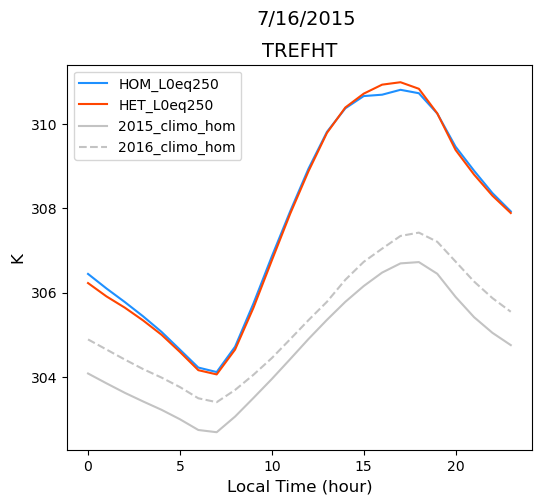

In [175]:
varPlot = 'TREFHT'
unitsString = 'K'
valMult = 1
setYlims = False
yMin = 200
yMax = 310

plotDiurnalCycle(selDS, 
                     varPlot, valMult, unitsString,
                     setYlims, yMin, yMax)

plt.plot(diuranlCylce_2015.hour.values, diuranlCylce_2015[varPlot].isel(case=0).values,color='dimgrey',alpha=0.4,label='2015_climo_hom')
plt.plot(diuranlCylce_2016.hour.values, diuranlCylce_2016[varPlot].isel(case=0).values,'--',color='dimgrey',alpha=0.4,label='2016_climo_hom')
plt.legend()
plt.gcf().text(0.44, 0.96, str(monSel)+'/'+str(daySel)+'/'+str(yrSel), fontsize=14)


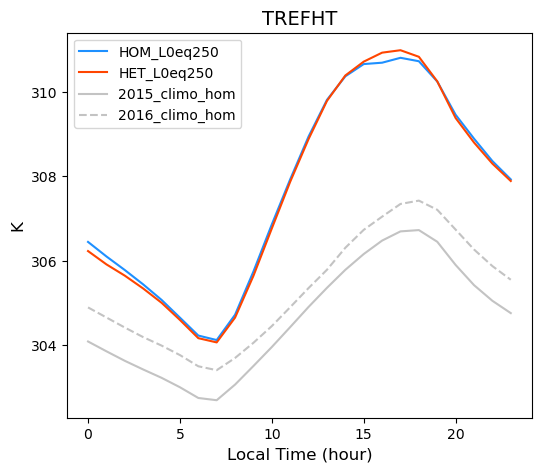

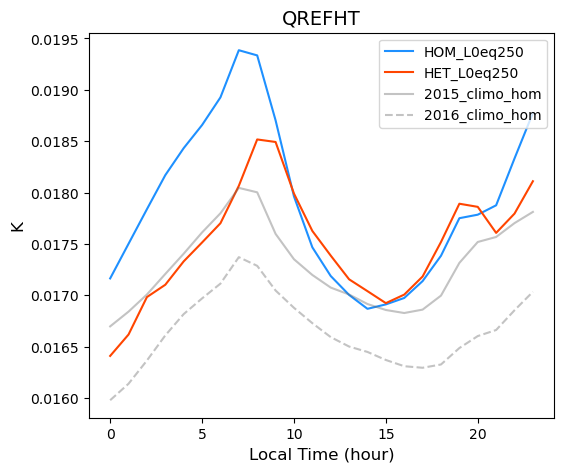

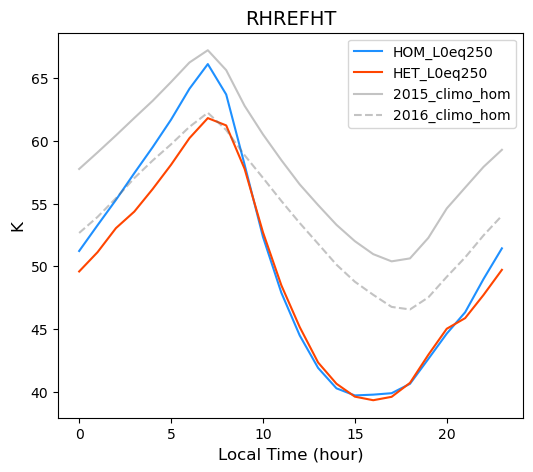

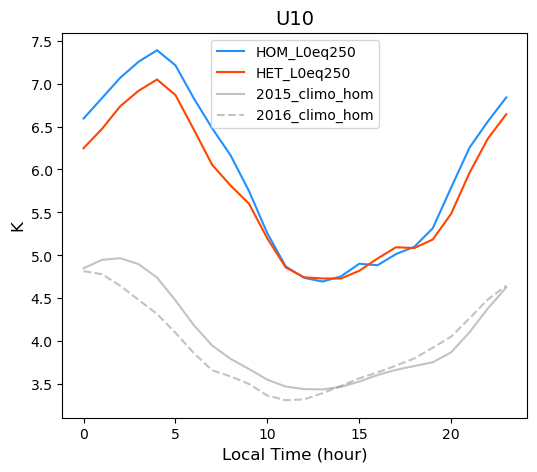

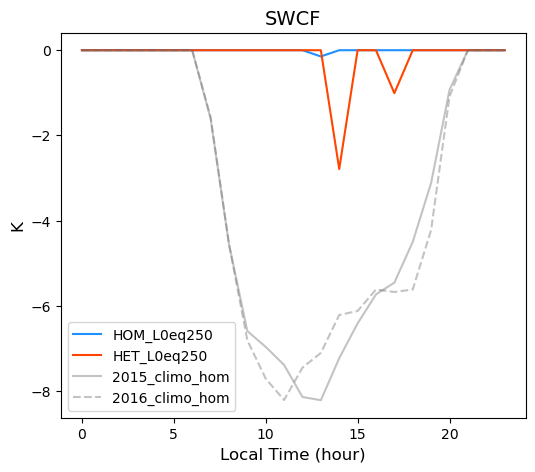

...

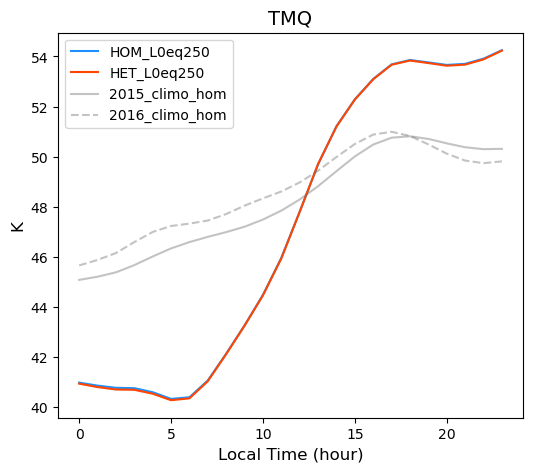

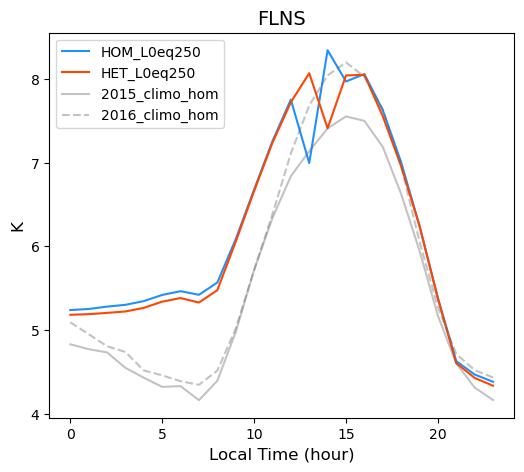

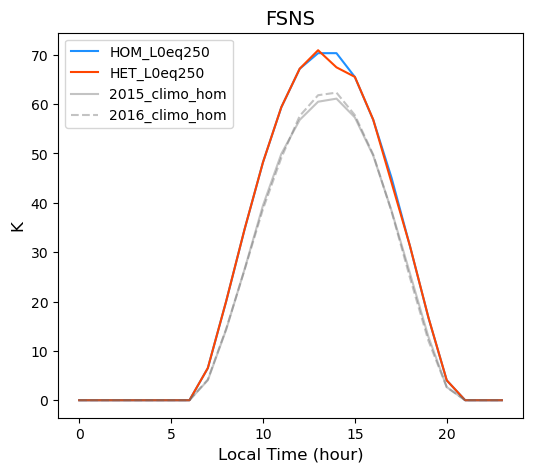

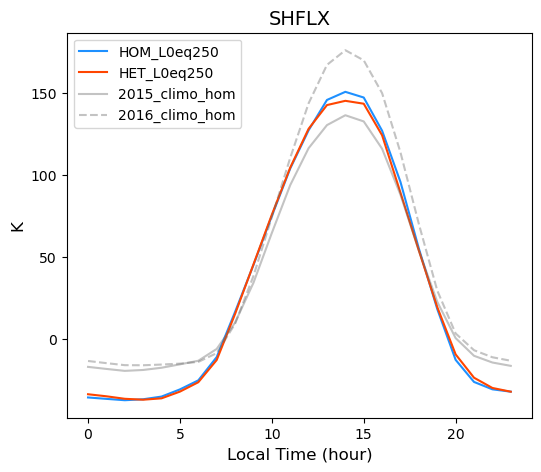

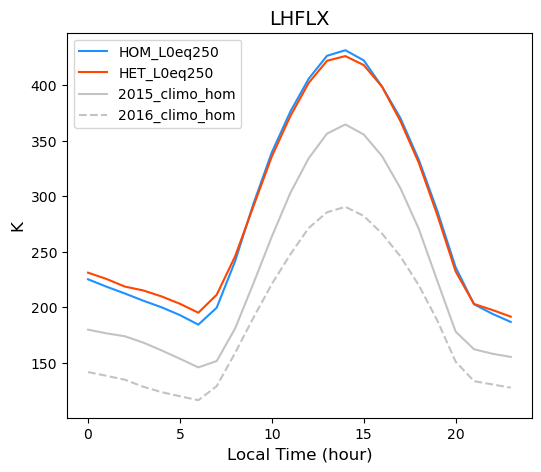

In [176]:
pltVars = ['TREFHT','QREFHT','RHREFHT',
           'U10','SWCF','LWCF','PRECC',
           'PRECT','TGCLDLWP',
          'CLDLOW','CLDTOT','TMQ', 
          'FLNS','FSNS','SHFLX','LHFLX']  

for iVar in range(len(pltVars)):
    plotDiurnalCycle(selDS, 
                     pltVars[iVar], valMult, unitsString,
                     setYlims, yMin, yMax)
    plt.plot(diuranlCylce_2015.hour.values, diuranlCylce_2015[ pltVars[iVar]].isel(case=0).values,color='dimgrey',alpha=0.4,label='2015_climo_hom')
    plt.plot(diuranlCylce_2016.hour.values, diuranlCylce_2016[ pltVars[iVar]].isel(case=0).values,'--',color='dimgrey',alpha=0.4,label='2016_climo_hom')
    plt.legend()

    

## Classify days

In [8]:
# %%time

# ## Classify L50 days 
# DSuse    = scamDS_h0_L50
# DSuse_h2 = scamDS_h2_L50
# # DSuse    = hourly_h0_L50
# # DSuse_h2 = hourly_h2_L50

# minHr = 6
# maxHr = 18
# # Use only these hours 
# DSuseSel = DSuse.isel(time=((DSuse.time.dt.hour >= minHr) & (DSuse.time.dt.hour <= maxHr)) )

# # Use near-surface level 
# DSuseSel = DSuseSel.isel(levInterp = (DSuseSel.levInterp>600))

# q_var = 'CLDLIQ_interp'
# p_var = 'PRECT'

# p_dailyMean = DSuseSel[p_var].resample(time='1D').mean()*1e3*86400
# q_dailyMax  = DSuseSel[q_var].resample(time='1D').mean().max(dim='levInterp')

# # Consistently use percentiles across cases, though numbers will vary
# plim = np.nanpercentile(p_dailyMean, 75)  #mm/day
# qlim = np.nanpercentile(q_dailyMax,  50) #kg/kg

# # Define days using their indices...
# iRainDay  = np.where(  (p_dailyMean.isel(case=0) >= plim) & (p_dailyMean.isel(case=1) >= plim) )[0]

# iCloudDay = np.where( (p_dailyMean.isel(case=0) < plim) & (q_dailyMax.isel(case=0)>=qlim) & 
#                       (p_dailyMean.isel(case=1) < plim) & (q_dailyMax.isel(case=1)>=qlim))[0]

# iClearDay = np.where( (p_dailyMean.isel(case=0) < plim) & (q_dailyMax.isel(case=0)<qlim) & 
#                       (p_dailyMean.isel(case=1) < plim) & (q_dailyMax.isel(case=1)<qlim))[0]

# print('Number of rainy  days: ', len(iRainDay))
# print('Number of cloudy days: ', len(iCloudDay))
# print('Number of clear  days: ', len(iClearDay))

# # - - - - - - - - - - - - - - - - - - -
# ## Get those times in the full arrays 
# # - - - - - - - - - - - - - - - - - - -
# iclear_times  = []
# icloudy_times = []
# irainy_times  = []

# for iT in range(len(p_dailyMean.time.values)):
#     thisDay = p_dailyMean.isel(time=iT)
#     iTimes = np.where((DSuse['time.year'].values==thisDay['time.year'].values) & 
#                       (DSuse['time.month'].values==thisDay['time.month'].values) &
#                       (DSuse['time.day'].values==thisDay['time.day'].values))[0]

#     if iT in iClearDay:
#         iclear_times = np.append(iclear_times, iTimes) 
#     elif iT in iCloudDay:
#         icloudy_times = np.append(icloudy_times, iTimes) 
#     elif iT in iRainDay: 
#         irainy_times = np.append(irainy_times, iTimes) 

# print('Selecting times in full array (no resampling)')
# clear_h0_L50  = DSuse.isel(time=iclear_times.astype(int))
# cloudy_h0_L50 = DSuse.isel(time=icloudy_times.astype(int))
# rainy_h0_L50  = DSuse.isel(time=irainy_times.astype(int))

# clear_h2_L50  = DSuse_h2.isel(time=iclear_times.astype(int))
# cloudy_h2_L50 = DSuse_h2.isel(time=icloudy_times.astype(int))
# rainy_h2_L50  = DSuse_h2.isel(time=irainy_times.astype(int))


In [68]:
%%time

## Classify L250 days 
DSuse    = scamDS_h0_L250
DSuse_h2 = scamDS_h2_L250

minHr = 6
maxHr = 18
# Use only these hours 
DSuseSel = DSuse.isel(time=((DSuse.time.dt.hour >= minHr) & (DSuse.time.dt.hour <= maxHr)) )

# Use near-surface level 
DSuseSel = DSuseSel.isel(levInterp = (DSuseSel.levInterp>600))

q_var = 'CLDLIQ_interp'
p_var = 'PRECT'

p_dailyMean = DSuseSel[p_var].resample(time='1D').mean()*1e3*86400
q_dailyMax  = DSuseSel[q_var].resample(time='1D').mean().max(dim='levInterp')

# Consistently use percentiles across cases, though numbers will vary
plim = np.nanpercentile(p_dailyMean, 75)  #mm/day
qlim = np.nanpercentile(q_dailyMax,  50) #kg/kg
print('plim = ', plim)
print('qlim = ', qlim)

# Define days using their indices...
iRainDay  = np.where(  (p_dailyMean.isel(case=0) >= plim) & (p_dailyMean.isel(case=1) >= plim) )[0]

iCloudDay = np.where( (p_dailyMean.isel(case=0) < plim) & (q_dailyMax.isel(case=0)>=qlim) & 
                      (p_dailyMean.isel(case=1) < plim) & (q_dailyMax.isel(case=1)>=qlim))[0]

iClearDay = np.where( (p_dailyMean.isel(case=0) < plim) & (q_dailyMax.isel(case=0)<qlim) & 
                      (p_dailyMean.isel(case=1) < plim) & (q_dailyMax.isel(case=1)<qlim))[0]

print('Number of rainy  days: ', len(iRainDay))
print('Number of cloudy days: ', len(iCloudDay))
print('Number of clear  days: ', len(iClearDay))

# - - - - - - - - - - - - - - - - - - -
## Get those times in the full arrays 
# - - - - - - - - - - - - - - - - - - -
iclear_times  = []
icloudy_times = []
irainy_times  = []

for iT in range(len(p_dailyMean.time.values)):
    thisDay = p_dailyMean.isel(time=iT)
    iTimes = np.where((DSuse['time.year'].values==thisDay['time.year'].values) & 
                      (DSuse['time.month'].values==thisDay['time.month'].values) &
                      (DSuse['time.day'].values==thisDay['time.day'].values))[0]

    if iT in iClearDay:
        iclear_times = np.append(iclear_times, iTimes) 
    elif iT in iCloudDay:
        icloudy_times = np.append(icloudy_times, iTimes) 
    elif iT in iRainDay: 
        irainy_times = np.append(irainy_times, iTimes) 

print('Selecting times in full array (no resampling)')
clear_h0_L250  = DSuse.isel(time=iclear_times.astype(int))
cloudy_h0_L250 = DSuse.isel(time=icloudy_times.astype(int))
rainy_h0_L250  = DSuse.isel(time=irainy_times.astype(int))

clear_h2_L250  = DSuse_h2.isel(time=iclear_times.astype(int))
cloudy_h2_L250 = DSuse_h2.isel(time=icloudy_times.astype(int))
rainy_h2_L250  = DSuse_h2.isel(time=irainy_times.astype(int))


plim =  4.893184787943028
qlim =  2.711743194345431e-13
Number of rainy  days:  43
Number of cloudy days:  42
Number of clear  days:  83
Selecting times in full array (no resampling)
CPU times: user 4.91 s, sys: 471 ms, total: 5.38 s
Wall time: 6.18 s


**Look at individual clear days**

In [98]:
%%time 
cloudHourly_clearDays  = clear_h0_L250['CLOUD_interp'].load().resample(time='1H').mean().dropna(dim='time')
cldliqHourly_clearDays = clear_h0_L250['CLDLIQ_interp'].load().resample(time='1H').mean().dropna(dim='time')
prectHourly_clearDays  = clear_h0_L250['PRECT'].load().resample(time='1H').mean().dropna(dim='time')
cldtotHourly_clearDays = clear_h0_L250['CLDTOT'].load().resample(time='1H').mean().dropna(dim='time')
trefhtHourly_clearDays = clear_h0_L250['TREFHT'].load().resample(time='1H').mean().dropna(dim='time')
nplumesHourly_clearDays = clear_h0_L250['nPlumesActive'].load().resample(time='1H').mean().dropna(dim='time')


CPU times: user 327 ms, sys: 0 ns, total: 327 ms
Wall time: 368 ms


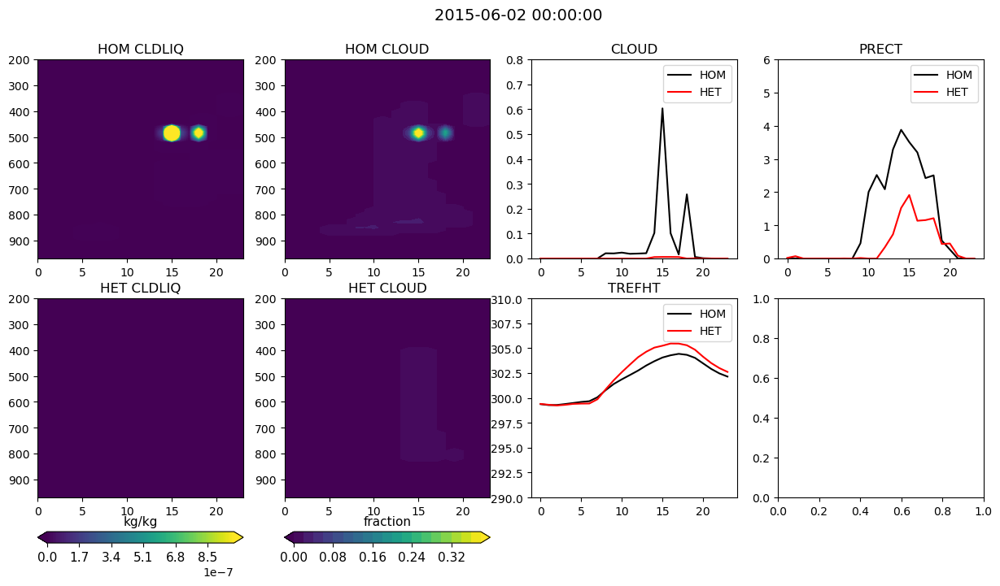

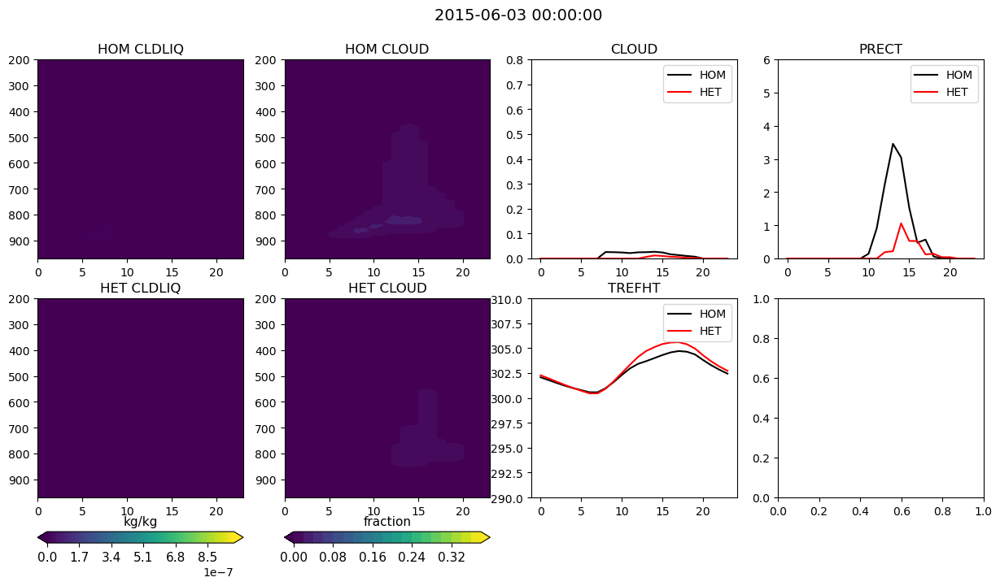

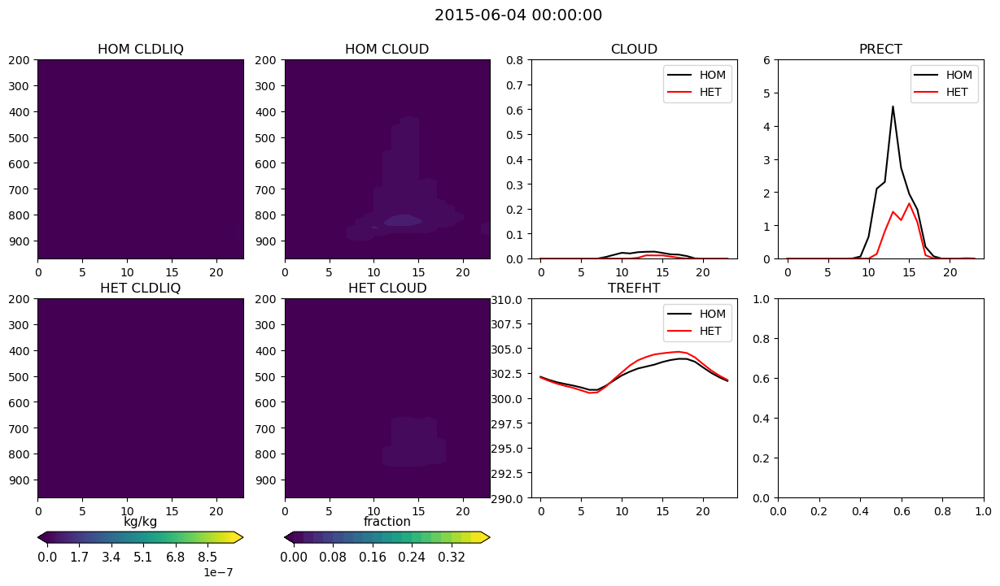

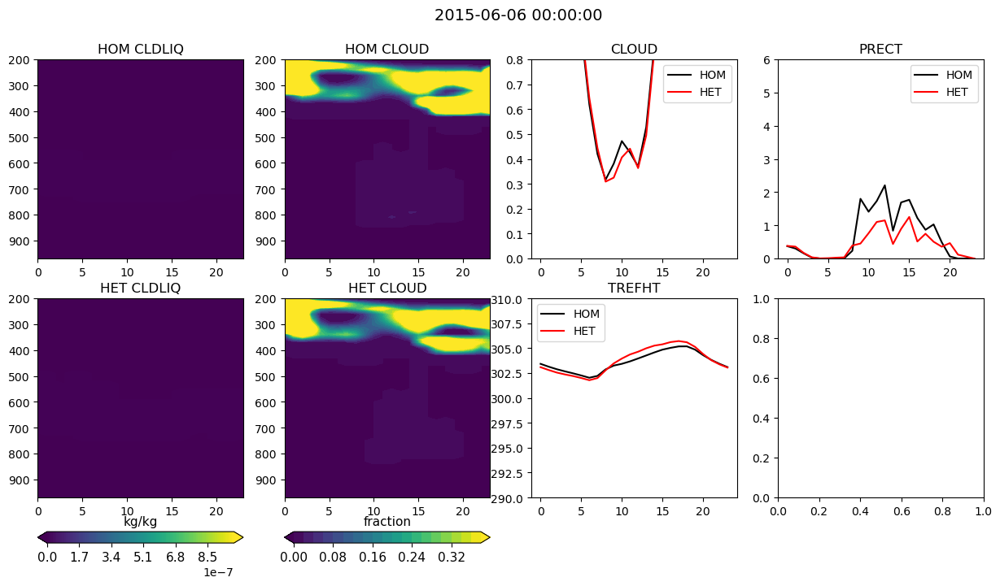

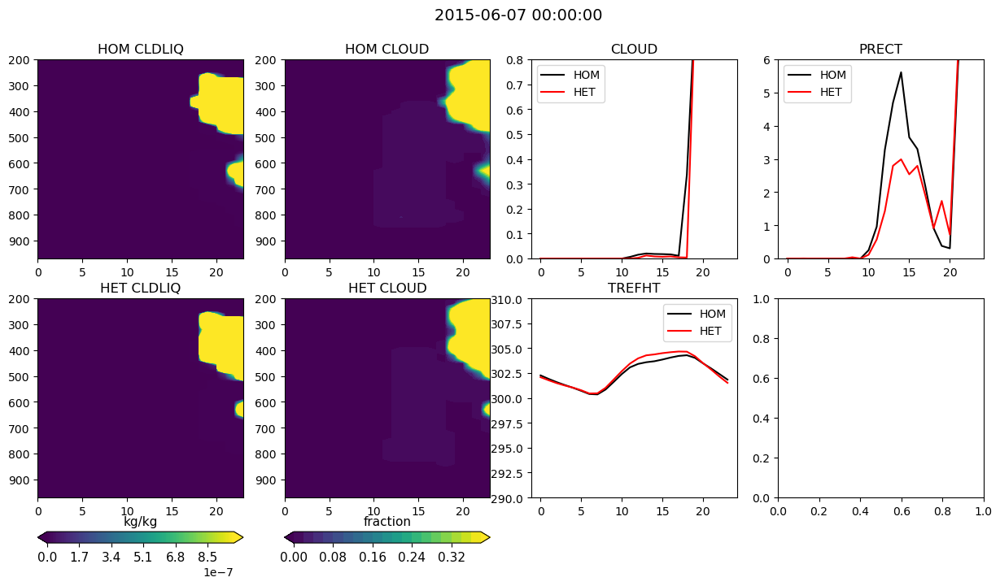

...

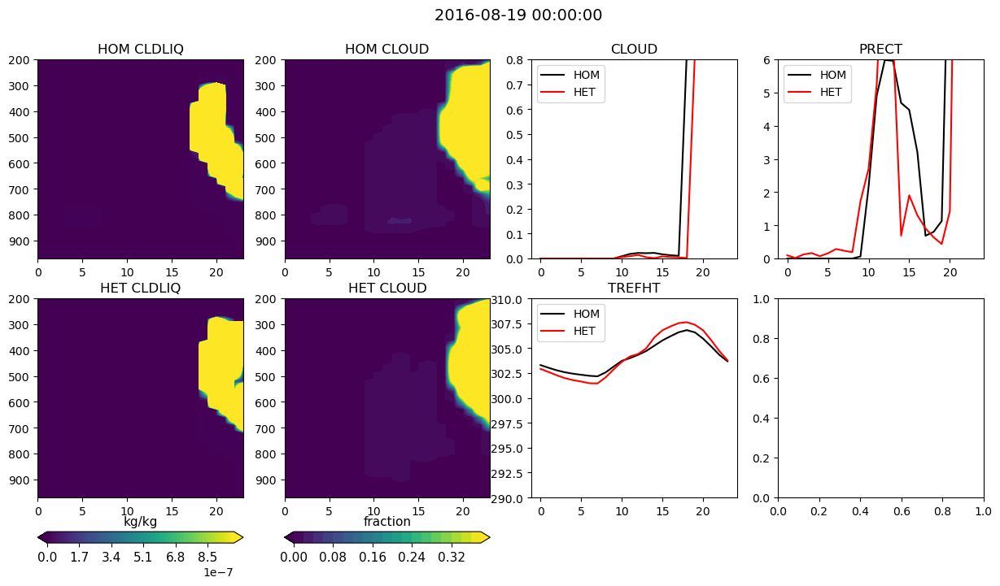

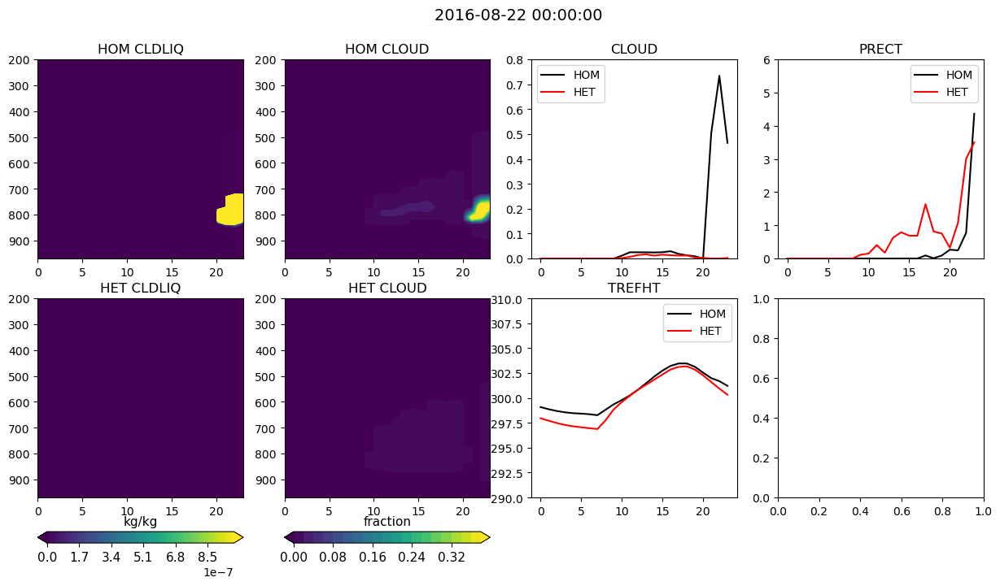

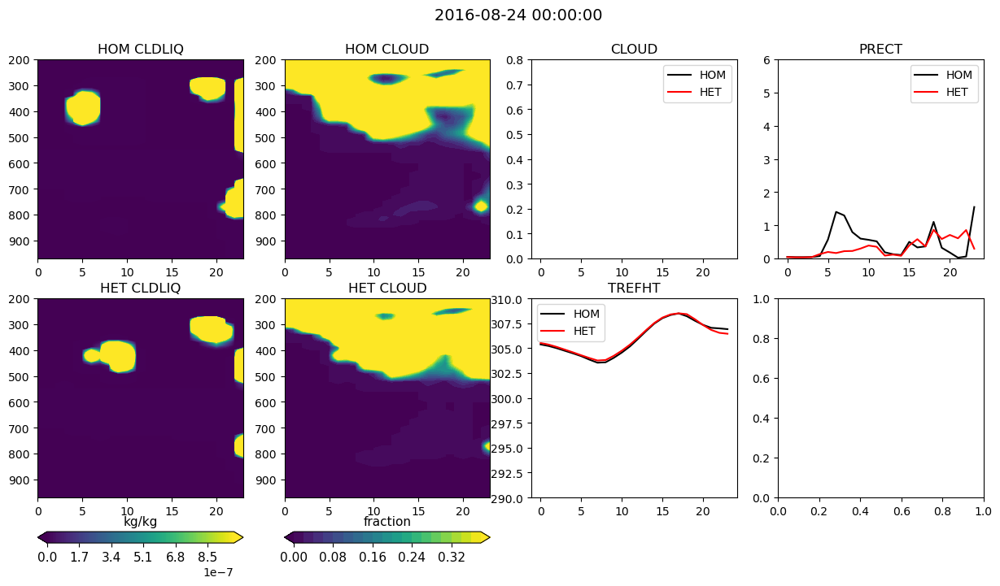

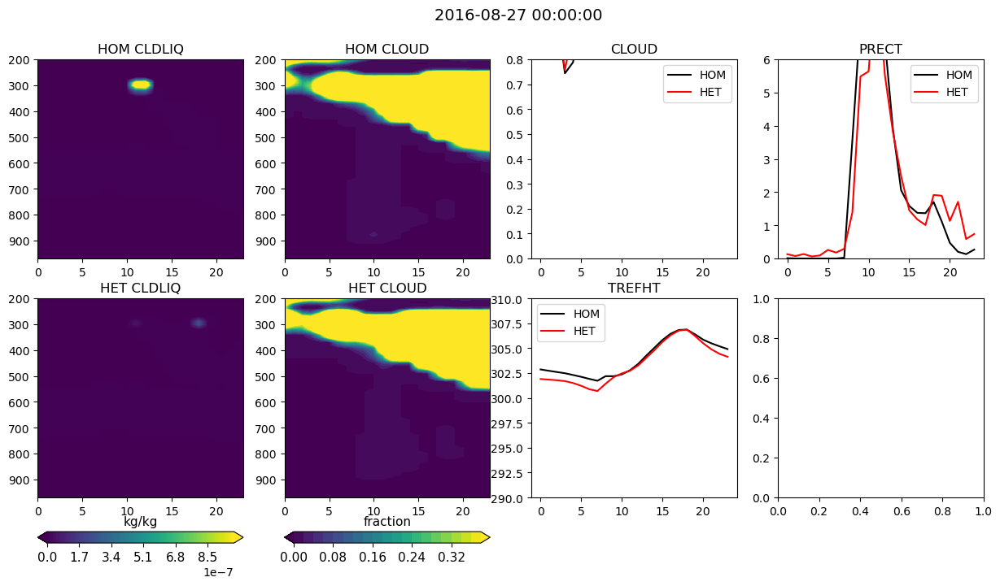

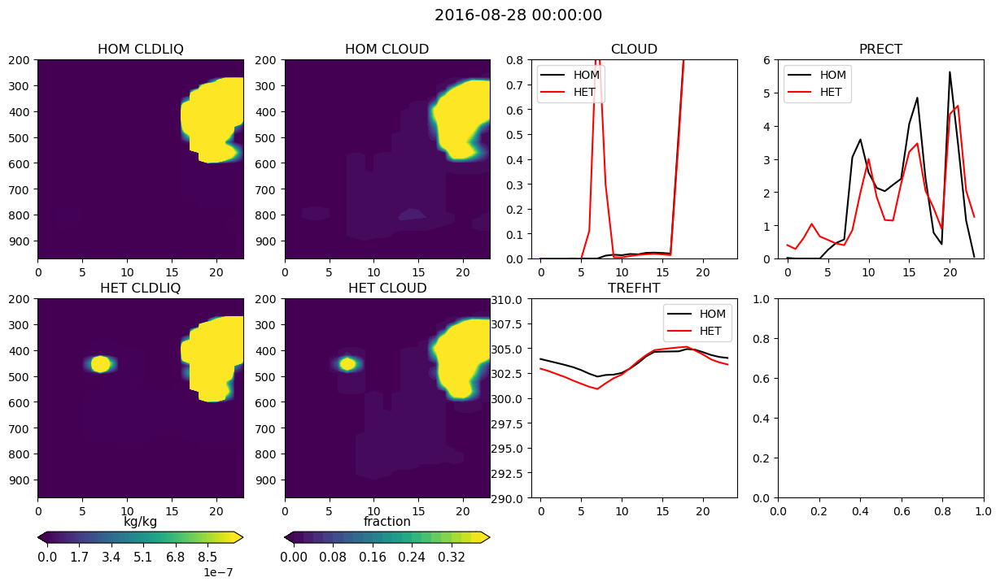

In [99]:
clearDates = np.unique(cloudHourly_clearDays['time'].dt.floor('D'))
clearDates = pd.to_datetime(clearDates)

cldliq_lims = np.arange(0, 1e-6, 1e-8)
cld_lims = np.arange(0,0.4,0.02)

for iDay in range(len(clearDates)): 
# for iDay in range(3): 
    iTimes = np.where((cloudHourly_clearDays['time.year']==clearDates.year[iDay]) & 
                      (cloudHourly_clearDays['time.month']==clearDates.month[iDay]) &
                      (cloudHourly_clearDays['time.day']==clearDates.day[iDay]))[0]
    
    ## Make some plots for every day
    fig,axs = plt.subplots(2,4, figsize=(15,7))
    axs     = axs.ravel()

    plt.gcf().text(0.45, 0.95, str(clearDates[iDay]), fontsize=14)

    axs[0].contourf(np.arange(0,24), cldliqHourly_clearDays.levInterp.values,
                    cldliqHourly_clearDays.isel(time=iTimes, case=0).values.transpose(), 
                    cldliq_lims, extend='both')
    axs[0].invert_yaxis()
    axs[0].set_title('HOM CLDLIQ')

    axs[1].contourf(np.arange(0,24), cloudHourly_clearDays.levInterp.values,
                    cloudHourly_clearDays.isel(time=iTimes, case=0).values.transpose(), 
                    cld_lims, extend='both')
    axs[1].invert_yaxis()
    axs[1].set_title('HOM CLOUD')
 
    c=axs[4].contourf(np.arange(0,24), cldliqHourly_clearDays.levInterp.values,
                    cldliqHourly_clearDays.isel(time=iTimes, case=1).values.transpose(),
                    cldliq_lims, extend='both')
    axs[4].invert_yaxis()
    axs[4].set_title('HET CLDLIQ')
    # Add colorbar
    ax_position = axs[4].get_position()
    cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
    cbar = fig.colorbar(c, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(scamDS_h0_L250['CLDLIQ'].units, fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    
    c=axs[5].contourf(np.arange(0,24), cloudHourly_clearDays.levInterp.values,
                    cloudHourly_clearDays.isel(time=iTimes, case=1).values.transpose(), 
                    cld_lims, extend='both')
    axs[5].invert_yaxis()
    axs[5].set_title('HET CLOUD')
    # Add colorbar
    ax_position = axs[5].get_position()
    cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
    cbar = fig.colorbar(c, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(scamDS_h0_L250['CLOUD'].units, fontsize=11)
    cbar.ax.tick_params(labelsize=11)
    

    axs[2].plot(cldtotHourly_clearDays.isel(time=iTimes, case=0).values,'k', label='HOM')
    axs[2].plot(cldtotHourly_clearDays.isel(time=iTimes, case=1).values,'r',label='HET')
    axs[2].set_title('CLOUD')
    axs[2].legend()
    axs[2].set_ylim([0,0.8])

    axs[3].plot(1e3*86400*prectHourly_clearDays.isel(time=iTimes, case=0).values,'k', label='HOM')
    axs[3].plot(1e3*86400*prectHourly_clearDays.isel(time=iTimes, case=1).values,'r',label='HET')
    axs[3].set_title('PRECT')
    axs[3].legend()
    axs[3].set_ylim([0,6])

    axs[6].plot(trefhtHourly_clearDays.isel(time=iTimes, case=0).values,'k', label='HOM')
    axs[6].plot(trefhtHourly_clearDays.isel(time=iTimes, case=1).values,'r',label='HET')
    axs[6].set_title('TREFHT')
    axs[6].legend()
    axs[6].set_ylim([290,310])

    # axs[7].plot(nplumesHourly_clearDays.isel(time=iTimes, case=0).values,'k', label='HOM')
    # axs[7].plot(nplumesHourly_clearDays.isel(time=iTimes, case=1).values,'r',label='HET')
    # axs[7].set_title('nPlumesActive')
    # axs[7].legend()
    # axs[7].set_ylim([0,25])



**do the same, but for cloudy days**

In [100]:
%%time 
cloudHourly_clearDays  = cloudy_h0_L250['CLOUD_interp'].load().resample(time='1H').mean().dropna(dim='time')
cldliqHourly_clearDays = cloudy_h0_L250['CLDLIQ_interp'].load().resample(time='1H').mean().dropna(dim='time')
prectHourly_clearDays  = cloudy_h0_L250['PRECT'].load().resample(time='1H').mean().dropna(dim='time')
cldtotHourly_clearDays = cloudy_h0_L250['CLDTOT'].load().resample(time='1H').mean().dropna(dim='time')
trefhtHourly_clearDays = cloudy_h0_L250['TREFHT'].load().resample(time='1H').mean().dropna(dim='time')
nplumesHourly_clearDays = cloudy_h0_L250['nPlumesActive'].load().resample(time='1H').mean().dropna(dim='time')


CPU times: user 2.93 s, sys: 749 ms, total: 3.68 s
Wall time: 8.67 s


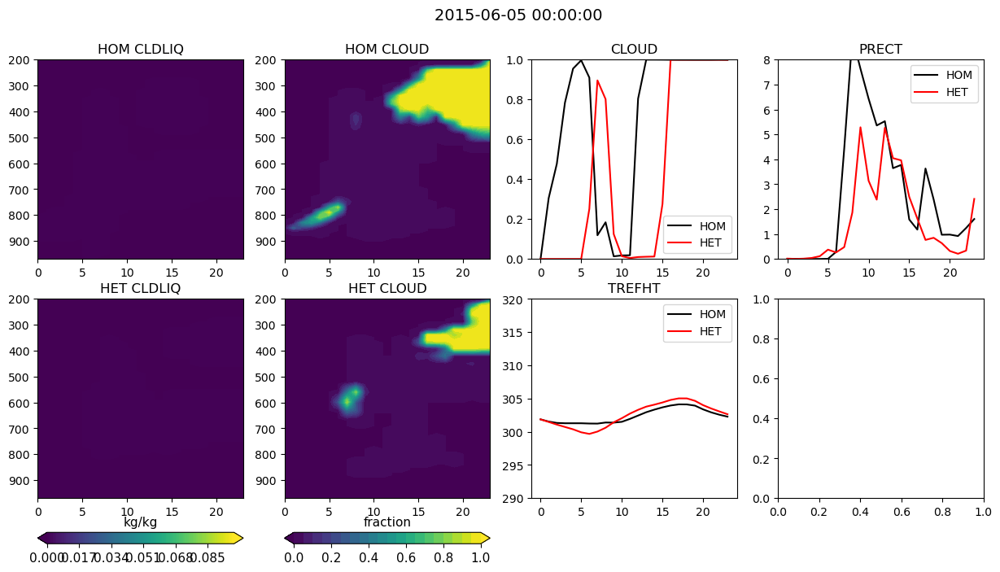

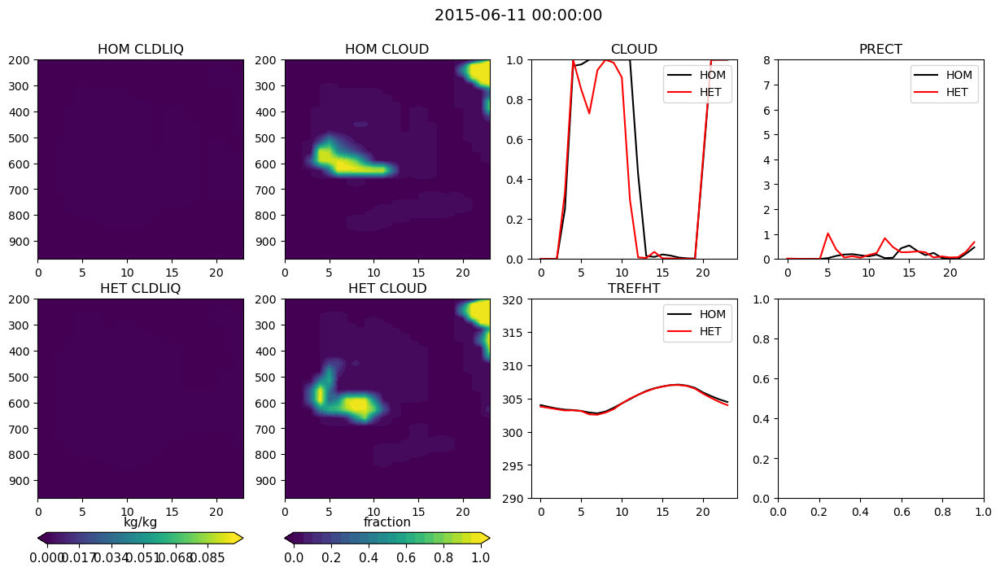

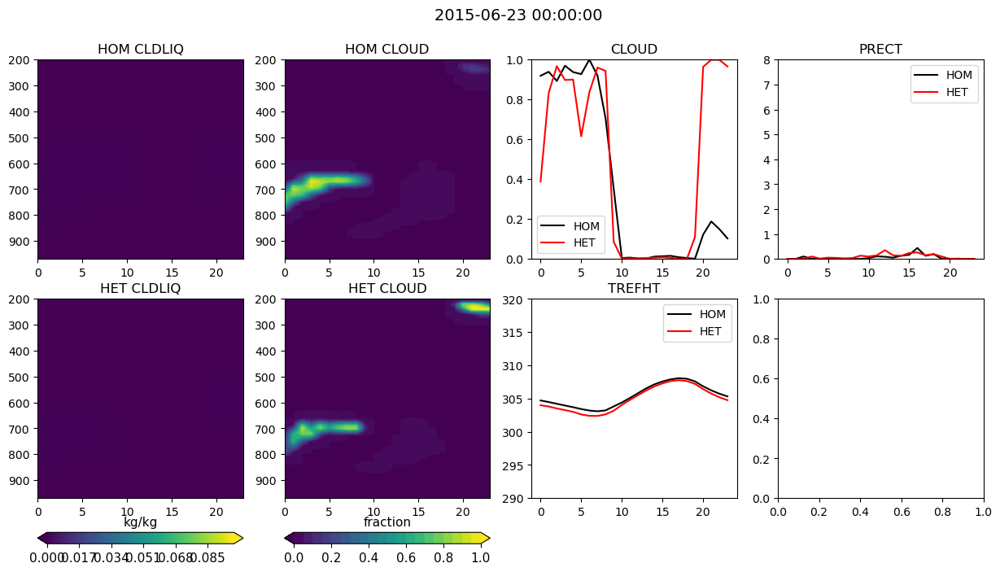

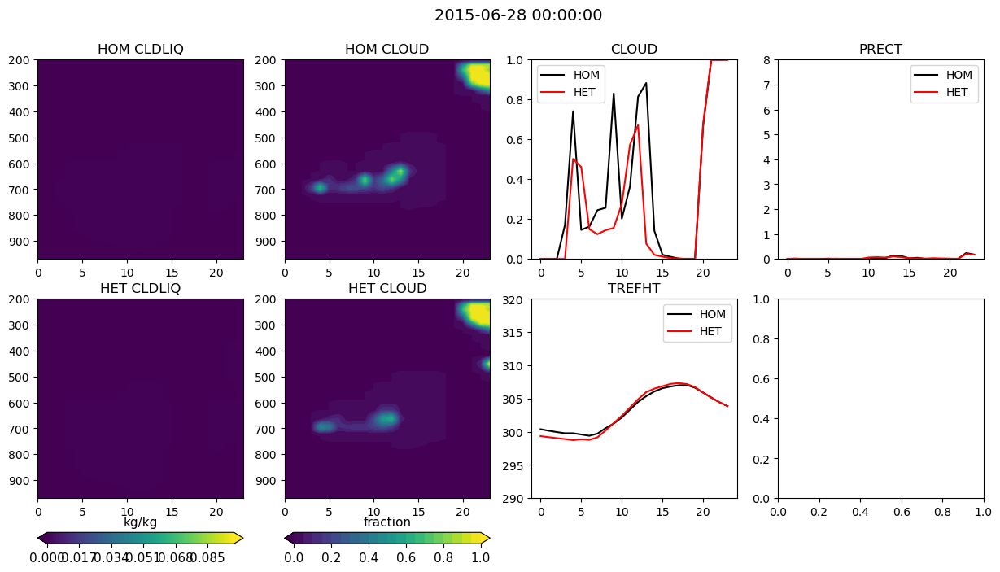

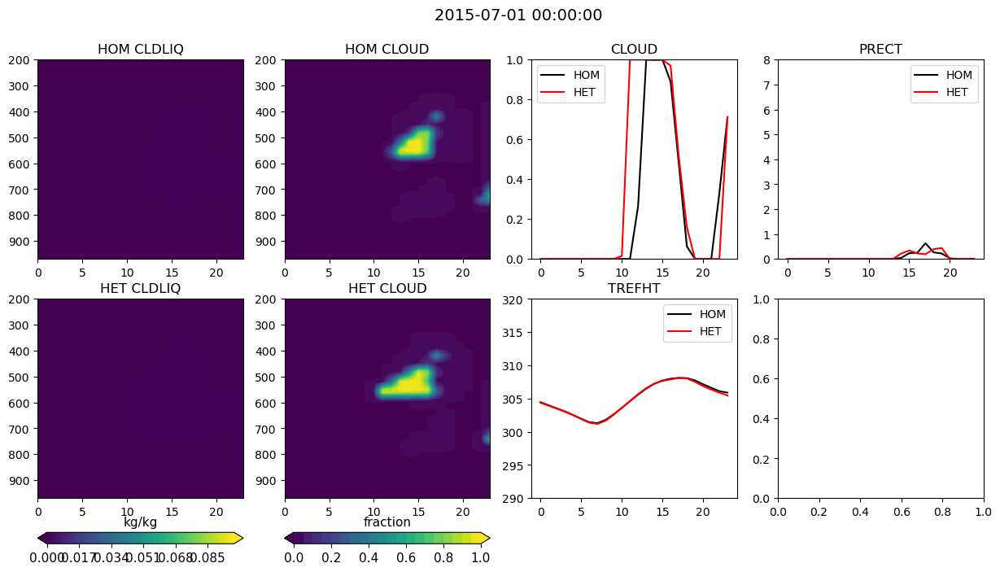

...

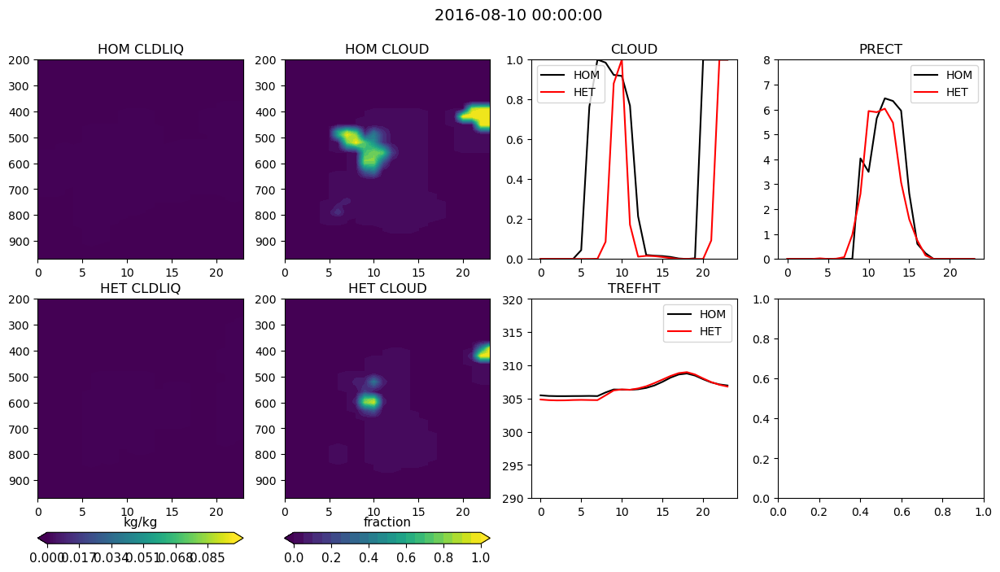

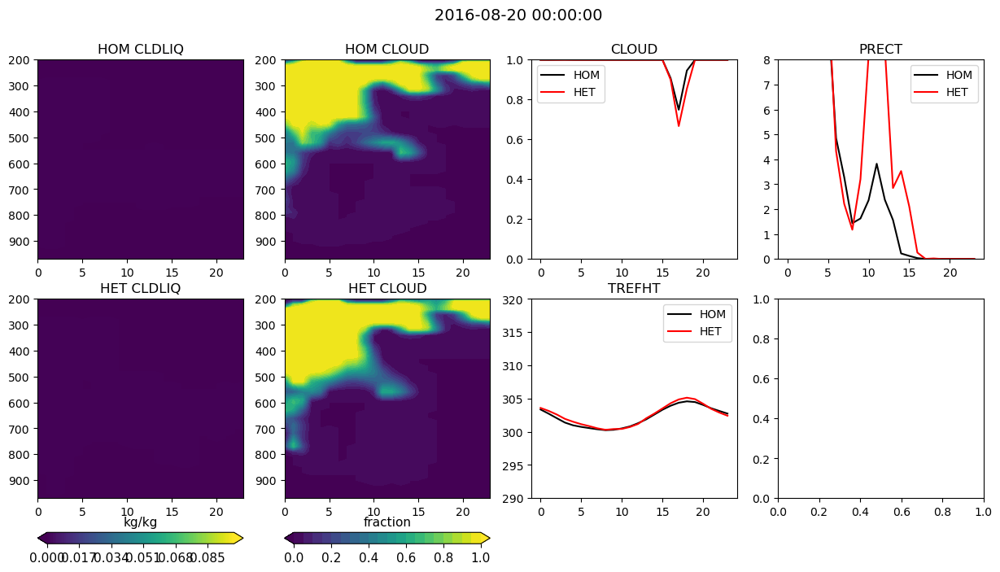

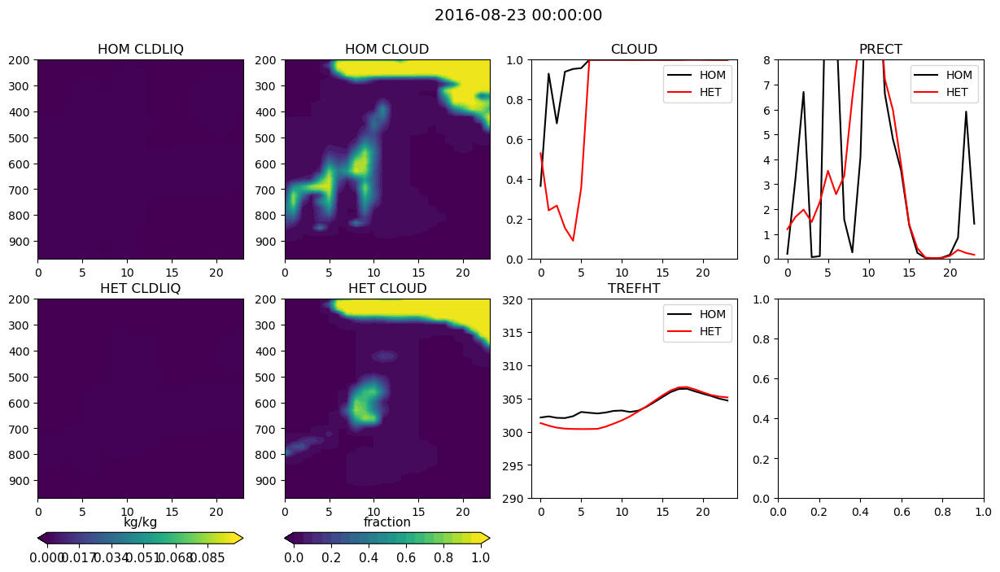

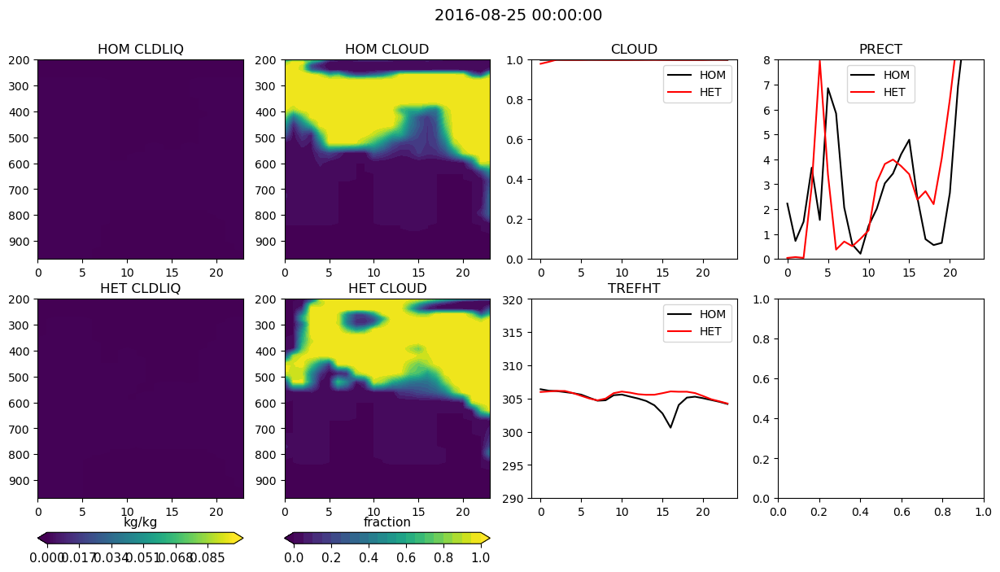

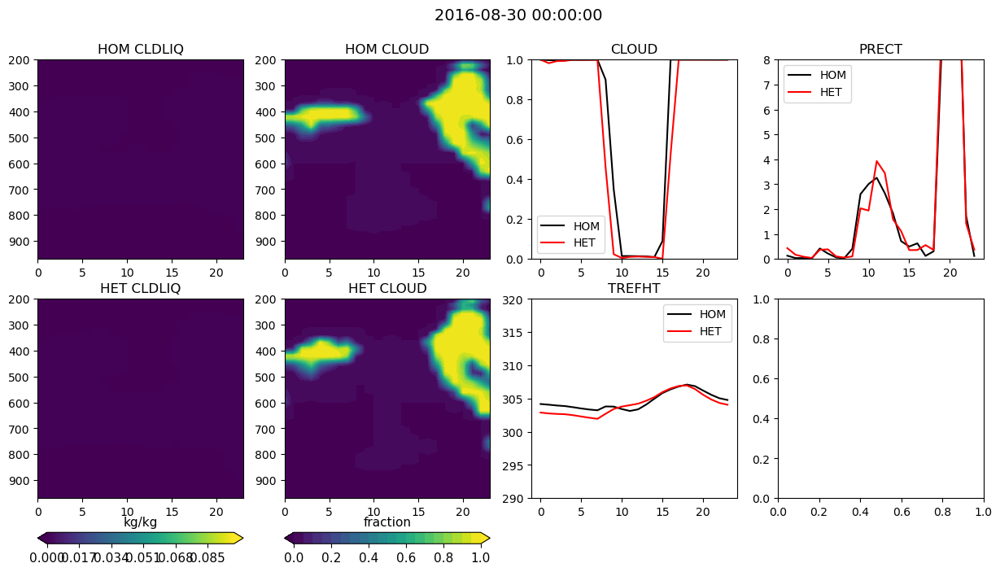

In [142]:
clearDates = np.unique(cloudHourly_clearDays['time'].dt.floor('D'))
clearDates = pd.to_datetime(clearDates)

cldliq_lims = np.arange(0, 1e-1, 1e-3)
cld_lims = np.arange(0,1.05,0.05)

for iDay in range(len(clearDates)): 
# for iDay in range(3): 
    iTimes = np.where((cloudHourly_clearDays['time.year']==clearDates.year[iDay]) & 
                      (cloudHourly_clearDays['time.month']==clearDates.month[iDay]) &
                      (cloudHourly_clearDays['time.day']==clearDates.day[iDay]))[0]
    
    ## Make some plots for every day
    fig,axs = plt.subplots(2,4, figsize=(15,7))
    axs     = axs.ravel()

    plt.gcf().text(0.45, 0.95, str(clearDates[iDay]), fontsize=14)

    axs[0].contourf(np.arange(0,24), cldliqHourly_clearDays.levInterp.values,
                    cldliqHourly_clearDays.isel(time=iTimes, case=0).values.transpose(), 
                    cldliq_lims, extend='both')
    axs[0].invert_yaxis()
    axs[0].set_title('HOM CLDLIQ')

    axs[1].contourf(np.arange(0,24), cloudHourly_clearDays.levInterp.values,
                    cloudHourly_clearDays.isel(time=iTimes, case=0).values.transpose(), 
                    cld_lims, extend='both')
    axs[1].invert_yaxis()
    axs[1].set_title('HOM CLOUD')
 
    c=axs[4].contourf(np.arange(0,24), cldliqHourly_clearDays.levInterp.values,
                    cldliqHourly_clearDays.isel(time=iTimes, case=1).values.transpose(),
                    cldliq_lims, extend='both')
    axs[4].invert_yaxis()
    axs[4].set_title('HET CLDLIQ')
    # Add colorbar
    ax_position = axs[4].get_position()
    cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
    cbar = fig.colorbar(c, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(scamDS_h0_L250['CLDLIQ'].units, fontsize=11)
    cbar.ax.tick_params(labelsize=11) 

    
    c=axs[5].contourf(np.arange(0,24), cloudHourly_clearDays.levInterp.values,
                    cloudHourly_clearDays.isel(time=iTimes, case=1).values.transpose(), 
                    cld_lims, extend='both')
    axs[5].invert_yaxis()
    axs[5].set_title('HET CLOUD')
    # Add colorbar
    ax_position = axs[5].get_position()
    cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
    cbar = fig.colorbar(c, cax=cbar_ax, orientation='horizontal')
    cbar.ax.locator_params(nbins=6)
    cbar.ax.set_title(scamDS_h0_L250['CLOUD'].units, fontsize=11)
    cbar.ax.tick_params(labelsize=11)
    

    axs[2].plot(cldtotHourly_clearDays.isel(time=iTimes, case=0).values,'k', label='HOM')
    axs[2].plot(cldtotHourly_clearDays.isel(time=iTimes, case=1).values,'r',label='HET')
    axs[2].set_title('CLOUD')
    axs[2].legend()
    axs[2].set_ylim([0,1])

    axs[3].plot(1e3*86400*prectHourly_clearDays.isel(time=iTimes, case=0).values,'k', label='HOM')
    axs[3].plot(1e3*86400*prectHourly_clearDays.isel(time=iTimes, case=1).values,'r',label='HET')
    axs[3].set_title('PRECT')
    axs[3].legend()
    axs[3].set_ylim([0,8])

    axs[6].plot(trefhtHourly_clearDays.isel(time=iTimes, case=0).values,'k', label='HOM')
    axs[6].plot(trefhtHourly_clearDays.isel(time=iTimes, case=1).values,'r',label='HET')
    axs[6].set_title('TREFHT')
    axs[6].legend()
    axs[6].set_ylim([290,320])

    # axs[7].plot(nplumesHourly_clearDays.isel(time=iTimes, case=0).values,'k', label='HOM')
    # axs[7].plot(nplumesHourly_clearDays.isel(time=iTimes, case=1).values,'r',label='HET')
    # axs[7].set_title('nPlumesActive')
    # axs[7].legend()
    # axs[7].set_ylim([0,25])

